# ***ANÁLISIS AVANZADO DE LAS PROPIEDADES PETROFISICAS CON PHYTON y ANALISIS DE   REGISTROS ELECTRICOS DE ALTO VOLUMEN DE DATOS***

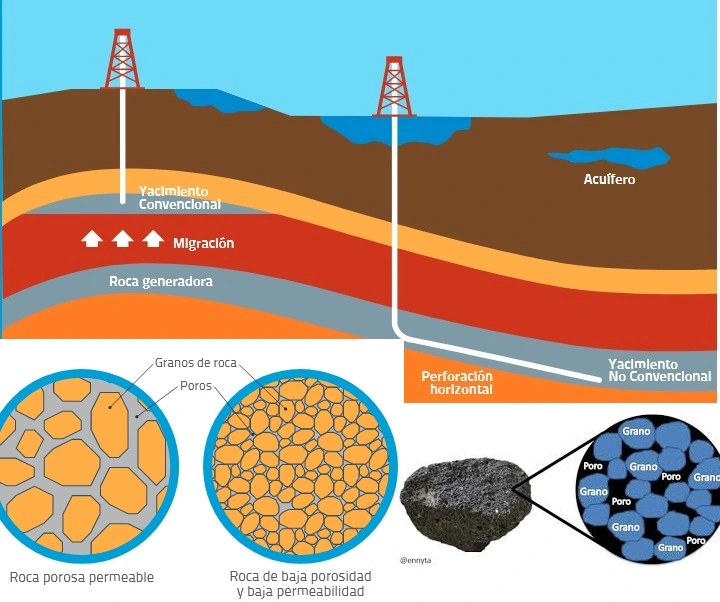

## Objetivo
---
- Determinar la mejor relación Permeabilidad Vs Porosidad entre registros eléctricos y datos de núcleo que permita identificar las mejores calidades de roca para el almacenamiento de hidrocarburo. 
```


## Situación actual  y metas del análisis
---
<p align = "justify">El análisis de datos de núcleo es un componente clave en la evaluación de un campo o yacimiento, ya que proporciona muestras directas de las formaciones geológicas en el subsuelo durante el intervalo de interés. A menudo, muchos lo consideran la "verdad de la roca" y se utiliza como referencia para calibrar las mediciones de registros de pozos y el análisis petrofísico. Los datos de núcleo son costosos de obtener y no se adquieren en todos los pozos a todas las profundidades. En cambio, puede adquirirse a intervalos discretos en una pequeña cantidad de pozos dentro de un campo y luego usarse como referencia para otros pozos

<p align = "justify">Una vez que se han extraído los datos del núcleo del pozo, se llevan a un laboratorio para analizarlos. A lo largo de la muestra de núcleo recuperada se realizan una serie de mediciones. Dos de los cuales son la porosidad y la permeabilidad, ambos componentes clave de un análisis petrofísico

<p align = "justify">La porosidad se define como el volumen de espacio entre los granos sólidos en relación con el volumen total de roca. Proporciona una indicación del espacio de almacenamiento potencial de hidrocarburos. La permeabilidad proporciona una indicación de la facilidad con la que los fluidos pueden fluir a través de la roca. La porosidad es un control clave de la permeabilidad, con poros más grandes que dan como resultado vías más amplias para que circulen los fluidos del yacimiento. Las herramientas de registro de pozos no proporcionan una medición directa de la permeabilidad y, por lo tanto, debe inferirse a través de relaciones con datos de núcleo del mismo campo o pozo de ecuaciones derivadas empíricamente.

<p align = "justify">En la industria del hidrocarburo uno de los aspectos más importantes es entender la relación que existe entre la porosidad y la permeabilidad, porque de ello depende directamente la producción de crudo. A través de los años se han aceptado relaciones empíricas como Windland o FZI (RQI) para entender como estas 2 variables pueden estar relacionadas. Miles de datos son tomados cada año en referencia a ello, tales como registros de pozos y mediciones directas en corazones de roca. Debido al alto volumen de datos es necesario encontrar la relación más directa entre estas 2 propiedades y para ello se recurre ciencia de datos, la cual permitirá determinar los mejores tipos de roca para el almacenamiento de hidrocarburo usando técnicas más avanzadas de análisis e interpretación  .</p>









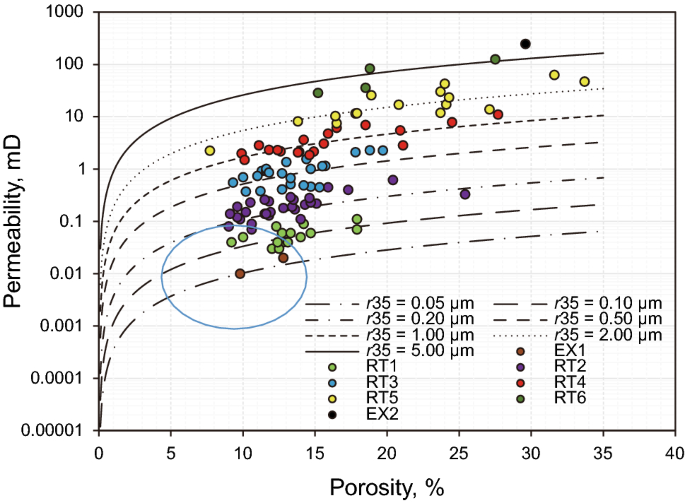 


En esta figura se muestra una Grafica de Winland que relaciona la porosidad con la permeabilidad y el diámetro de garganta poral. Esta es una imagen de ejemplo, no fue desarrollada en este analsis.

##Planeacion del análisis de datos
<p align = "justify">Se tienen 2 conjuntos de datos inicialmente: 1) Obtenido a través de mediciones directas de datos de laboratorio y otro 2) tomado indirectamente a través de registros eléctricos de pozo. El primer  set de datos cuenta con mediciones de porosidad y permeabilidad mientras que el segundo con solo mediciones de porosidad. El primer paso es hacer un análisis de ambos set de datos y así realizar un control de calidad de los mismo. Luego establecer a través de regresión lineal una relación entre los datos tomados en laboratorio y los registros de pozo con la finalidad de calibrar los datos obtenidos en pozo, en otras palabras establecer y una regresion lineal con el primer set de datos para aplicarlo al segundo set y asi encontar el valor de Permeabilidad. Finalmente hacer una agrupación de datos por sectores en pozo y cada sector buscarle la relación porosidad permeabilidad, lo cual es comunmente llamado tipos de roca o gráfico de Winland.</p>

##Entendimiento de los datos

In [ ]:
# Actualizamos scikit-learn a la última versión
!pip install -U scikit-learn 

# Importamos scikit-learn 
import sklearn

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib as mpl
import seaborn as sns
%matplotlib inline
plt.rcParams['figure.dpi'] = 110
import statsmodels.api as sm
#Matplotlib y Seaborn - Librerías de visualización.


# Visualización de grafos con graphviz.
import graphviz 
# Configuraciones para las librerías y módulos usados.

# Ignoramos las advertencias o warnings.
import warnings
warnings.simplefilter(action='ignore')

# Configuramos el formato por defecto de la 
# librería de visualización Matplotlib.
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 105
mpl.rcParams['figure.figsize'] = (9, 7)

In [ ]:
core_data = pd.read_excel("Data15_9-19A-CORE_B.xlsx",na_values=' ')

Aqui es importante observar que informacion contine el dataframe.

In [ ]:
core_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 728 entries, 0 to 727
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   DEPTH      728 non-null    float64
 1   OrigDepth  728 non-null    float64
 2   CORE_NO    728 non-null    int64  
 3   SAMPLE     728 non-null    int64  
 4   CKHG       557 non-null    float64
 5   CKHL       557 non-null    float64
 6   CKVG       141 non-null    float64
 7   CKVL       141 non-null    float64
 8   CPOR       593 non-null    float64
 9   CPORV      71 non-null     float64
 10  So         71 non-null     float64
 11  Sw         71 non-null     float64
 12  CGD        594 non-null    float64
 13  CGDV       71 non-null     float64
dtypes: float64(12), int64(2)
memory usage: 79.8 KB


Las columnas del dataframe corresponden a la descripción de los siguientes campos:

**Depth** = Profundidad en pies de la muestra

**OrigDepth** = Profundidad original de la muestra sin shift

**CORE_NO**= Numero del core al que pertenece la muestra

**Sample** = Numero de la muestra

**CKHG** = Permeabilidad al aire

**CKHL** = Permeabilidad

**CKVL** = Permeabilidad Vertical

**CPOR**= Porosidad

**CPORV** = porosidad en volumen

**So** = saturación de aceite

**Sw**= saturación de agua

**CGD**= core gamma densidad

**CGDV** = Core gama volumen







Del dataframe core_data con el fin de optimizar el proceso se seleccionará únicamente las columnas con las cuales se va a trabajar. Para ello se harán los siguientes análisis:



In [ ]:
core_data.head()

,DEPTH,OrigDepth,CORE_NO,SAMPLE,CKHG,CKHL,CKVG,CKVL,CPOR,CPORV,So,Sw,CGD,CGDV
0,3838.60,3837.00,1,1,13.80,11.500,NaN,NaN,17.0,NaN,NaN,NaN,2.66,NaN
1,3838.85,3837.25,1,2,NaN,NaN,NaN,NaN,14.8,NaN,NaN,NaN,2.67,NaN
2,3839.15,3837.55,1,3,25.20,21.400,3.94,3.16,10.8,NaN,NaN,NaN,2.69,NaN
3,3839.40,3837.80,1,4,1.02,0.694,NaN,NaN,12.8,NaN,NaN,NaN,2.70,NaN
4,3839.48,3837.88,1,5,NaN,NaN,NaN,NaN,NaN,18.8,52.9,36.4,NaN,2.68


**Estadistica Descriptiva**

Siempre es importante hacer un barrido de los datos usando tecnicas normales de estadistica descriptiva para ver que tan dispersos estan los datos y entenderlos.

In [ ]:
core_data.describe()

,DEPTH,OrigDepth,CORE_NO,SAMPLE,CKHG,CKHL,CKVG,CKVL,CPOR,CPORV,So,Sw,CGD,CGDV
count,728.000000,728.000000,728.00000,728.000000,557.000000,557.000000,141.000000,141.000000,593.000000,71.000000,71.000000,71.000000,594.000000,71.000000
mean,3920.528338,3920.153338,3.93956,364.500000,649.801463,627.972549,490.086071,472.875284,16.829342,19.497183,56.943662,28.309859,2.653569,2.656901
std,46.545695,46.902816,1.75976,210.299786,2160.127387,2116.307023,1973.601098,1929.420018,6.552523,5.657763,21.084319,19.203758,0.046735,0.035560
min,3838.600000,3837.000000,1.00000,1.000000,0.018000,0.010000,0.030000,0.017000,2.900000,2.700000,0.000000,4.500000,2.250000,2.620000
25%,3882.580000,3881.980000,3.00000,182.750000,2.620000,2.030000,0.874000,0.590000,12.000000,18.150000,52.000000,18.200000,2.640000,2.630000
50%,3921.725000,3921.125000,4.00000,364.500000,59.900000,52.300000,27.300000,23.300000,18.100000,21.200000,62.300000,22.800000,2.650000,2.650000
75%,3960.287500,3960.487500,5.00000,546.250000,213.000000,194.000000,108.000000,96.300000,21.700000,23.500000,68.500000,29.950000,2.660000,2.660000
max,3999.950000,3999.750000,7.00000,728.000000,20800.000000,20500.000000,14800.000000,14500.000000,36.000000,27.800000,86.000000,90.800000,3.030000,2.810000


Text(0, 0.5, 'Frecuencia')

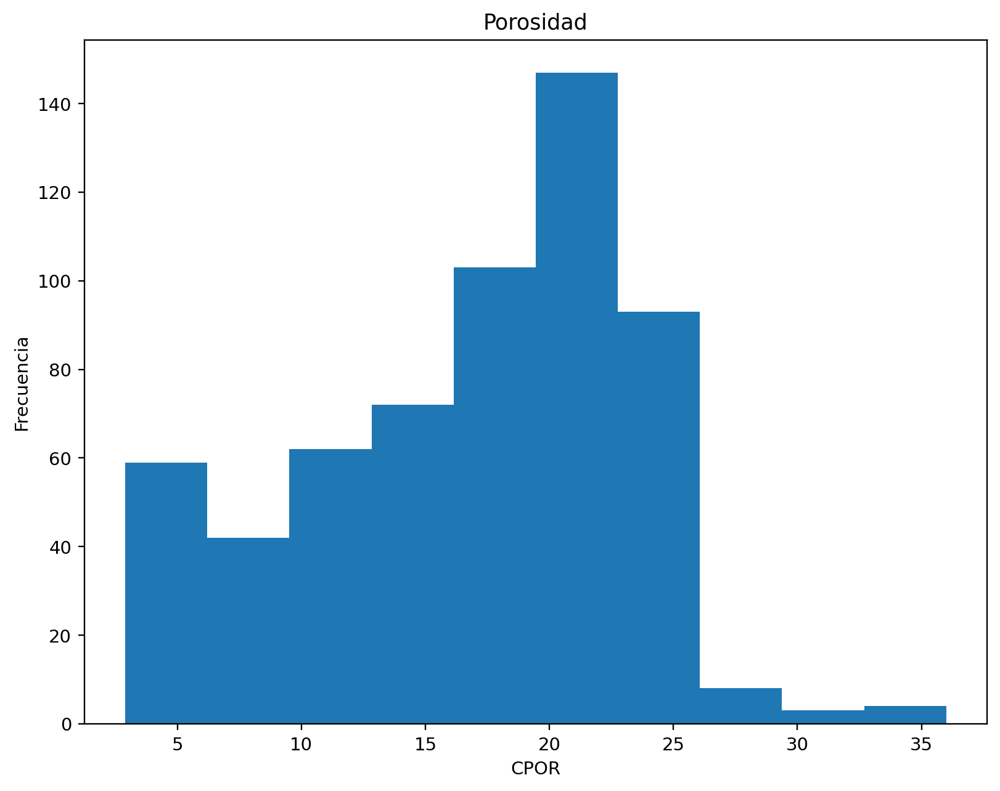

In [ ]:
plt.hist(core_data['CPOR']);
plt.title('Porosidad')
plt.xlabel('CPOR')
plt.ylabel('Frecuencia')


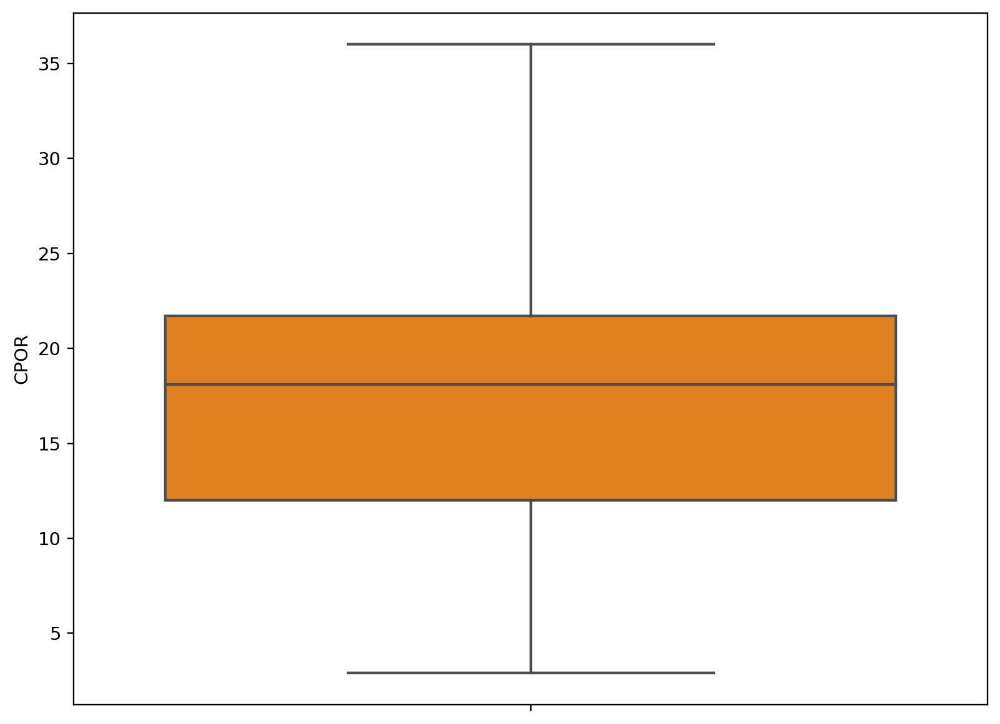

In [ ]:
datos_porosidad = sns.boxplot(y='CPOR', data=core_data, palette='afmhot')

Aqui podemos mirar una distribucion de los datos de porosidad, los cuales tienen valores aceptables.

Text(0, 0.5, 'Frecuencia')

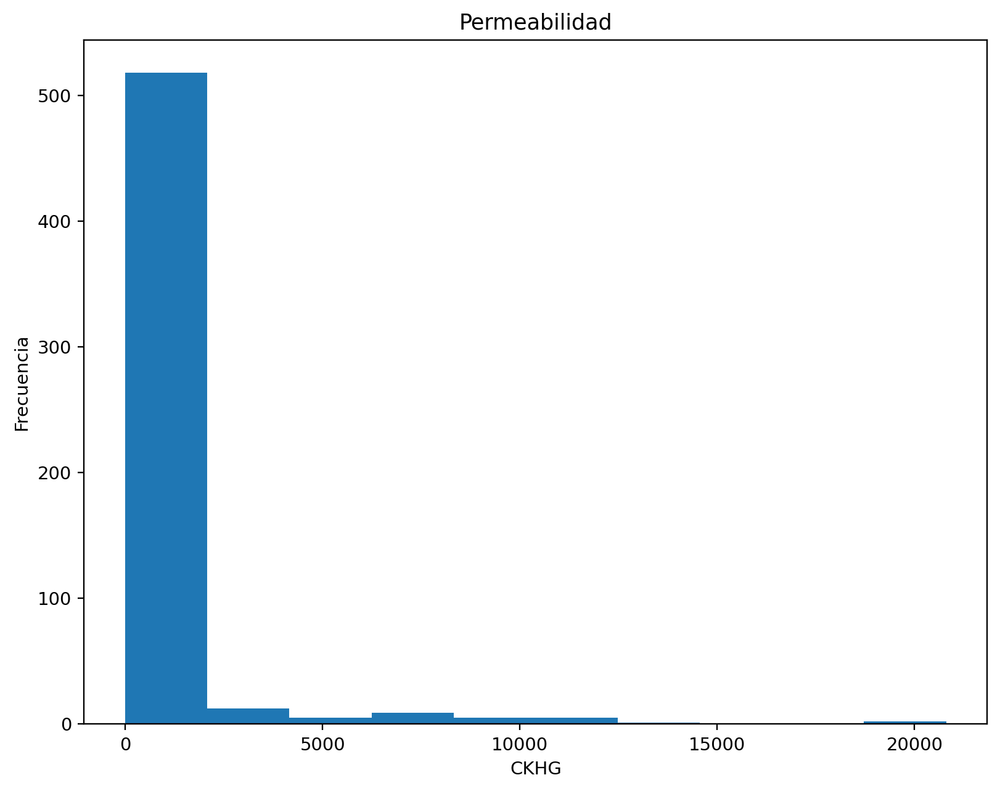

In [ ]:
plt.hist(core_data['CKHG']);
plt.title('Permeabilidad')
plt.xlabel('CKHG')
plt.ylabel('Frecuencia')


Text(0, 0.5, 'Frecuencia')

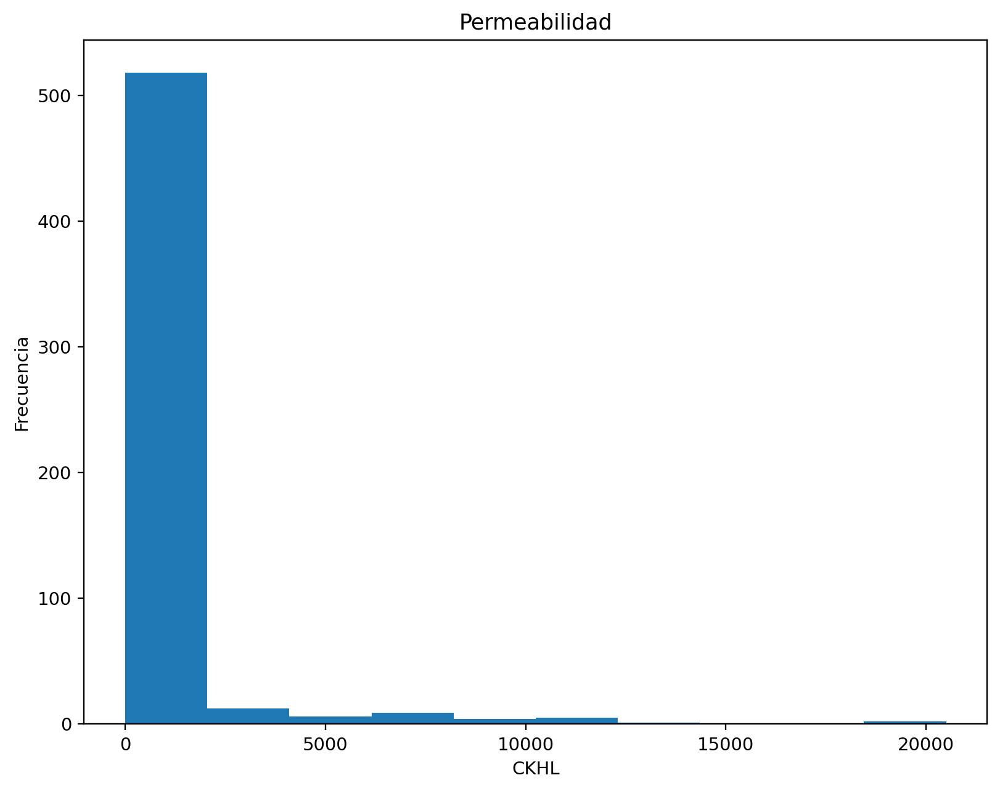

In [ ]:
plt.hist(core_data['CKHL']);
plt.title('Permeabilidad')
plt.xlabel('CKHL')
plt.ylabel('Frecuencia')

Text(0, 0.5, 'Frecuencia')

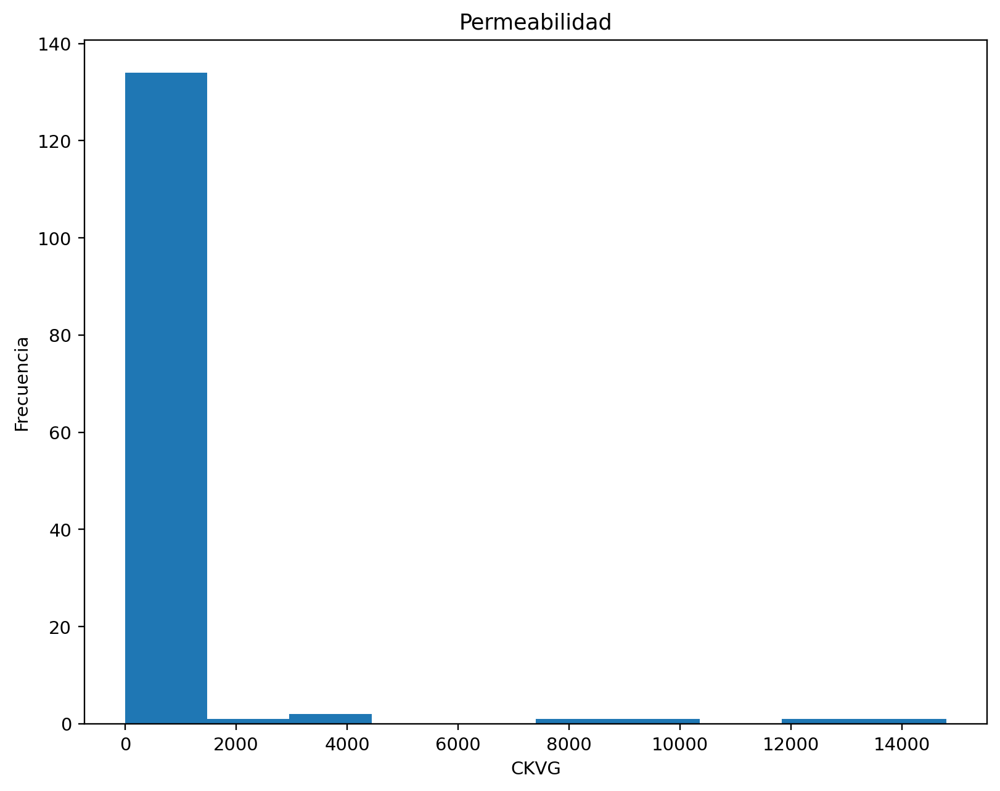

In [ ]:
plt.hist(core_data['CKVG']);
plt.title('Permeabilidad')
plt.xlabel('CKVG')
plt.ylabel('Frecuencia')

Text(0, 0.5, 'Frecuencia')

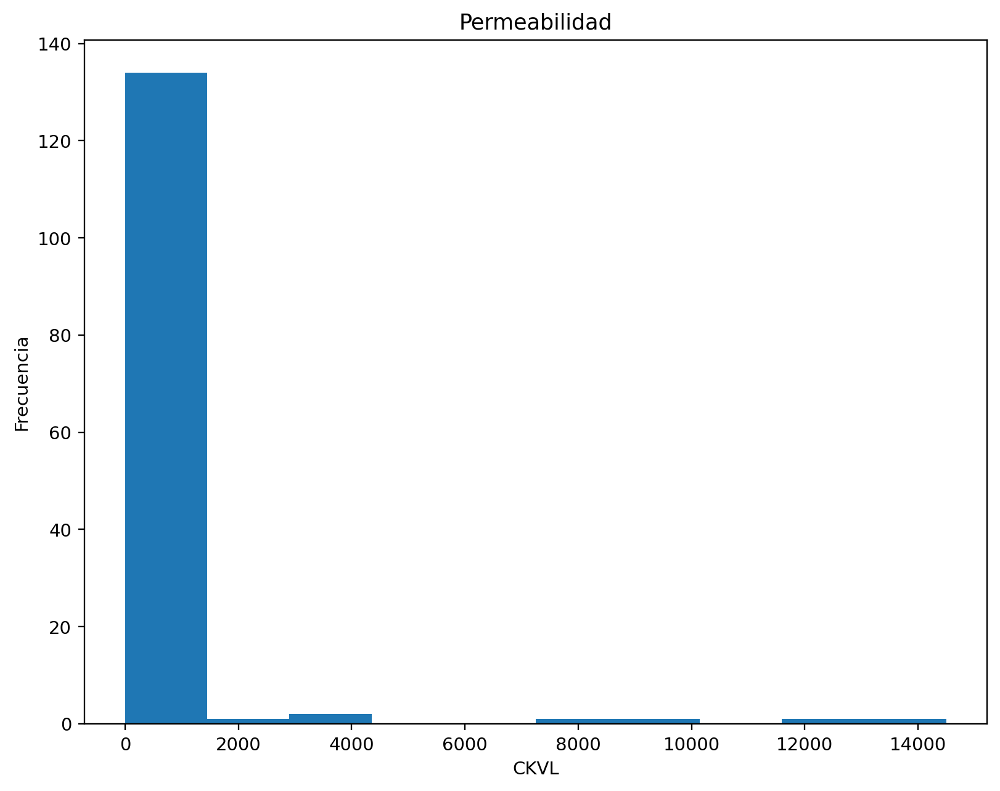

In [ ]:
plt.hist(core_data['CKVL']);
plt.title('Permeabilidad')
plt.xlabel('CKVL')
plt.ylabel('Frecuencia')

<p align = "justify">Al comparar los histogramas de permeabilidad no se nota una clara diferencia entre las permeabilidades medidas para seleccionar la mas relevante, por lo cual se hace necesario recurrir a otro esquema que de acuedo a mi experiencia la mejor opción seria acudir un mapa de calor.

**Preparacion de los datos**



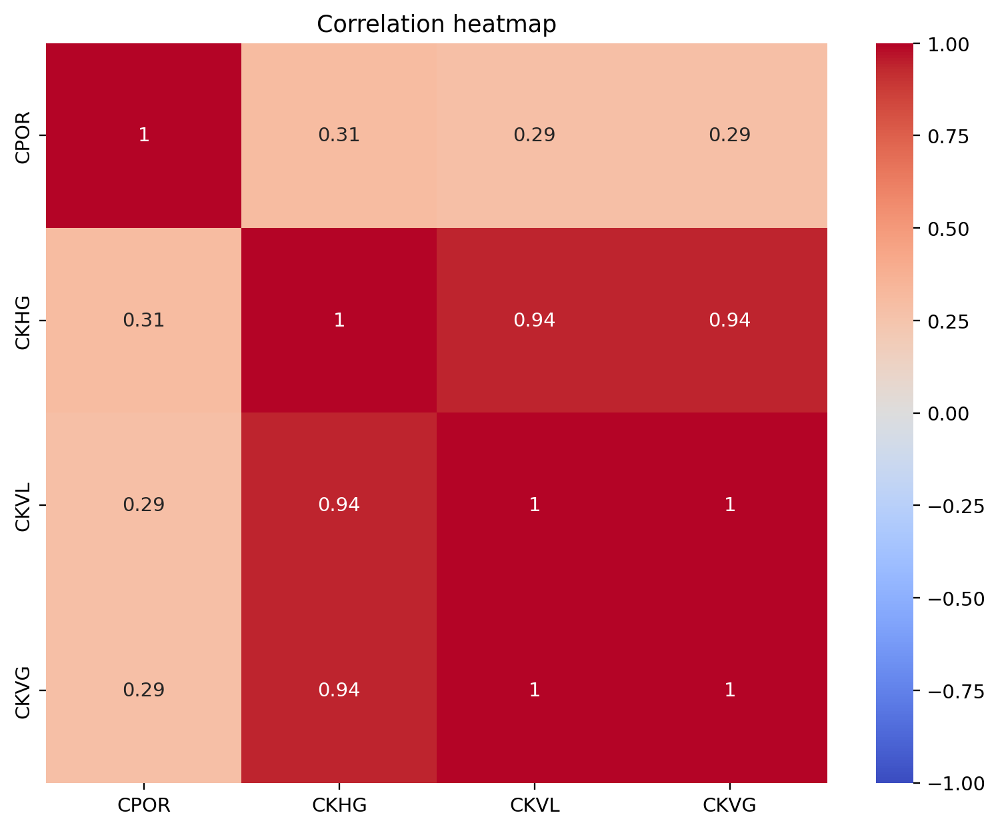

In [ ]:
poro_perm = core_data[['CPOR', 'CKHG','CKVL', 'CKVG',]].copy()
#poro_perm.dropna(inplace=True)
#Matriz de Correlación Pearson

corr_df = sns.heatmap(poro_perm.corr(method = 'pearson'), cmap='coolwarm', vmin=-1, vmax=1, annot=True)

corr_df.set_title('Correlation heatmap')
corr_df

plt.show()

<p align = "justify">Teniendo en cuenta la representacion de la relacion entre porosidad  y permeabilidad se evidencia por observación que el campo CKHG (permeabilidad) contiene la permeabilidad con el mejor factor de correlacion  relacionada a porosidad. A partir de ella comenzamos a desarrollar la regresion lineal. Aunque  el valor de correlacion  es bajo entre las variables (CPOR;CKHG) la experiencia en geologia nos indica que es la via correcta, adicionalmente es la mejor correlacion entre porosidad y permeabilidad.

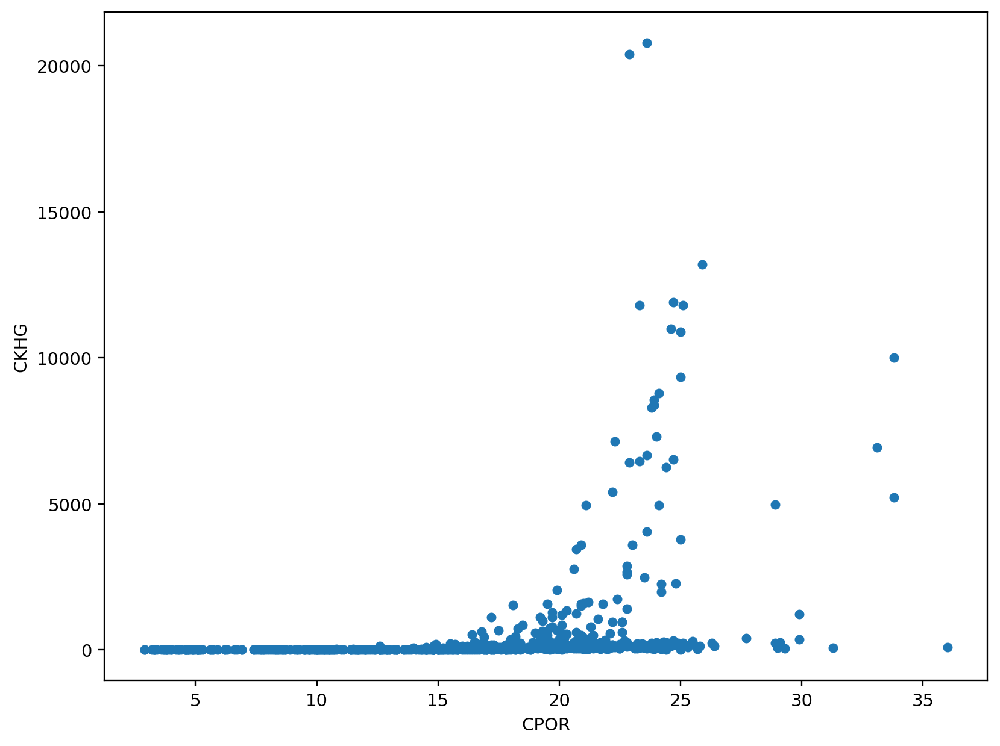

In [ ]:
core_data.plot(kind="scatter", x="CPOR", y="CKHG");

<p align = "justify">Con el fin de tener una primera vista de la relacion enre la porosidad  y la  permeabilidad se realiza una grafica de dispersion, pero se observa que es necesario modificar las escalas para tener una mejor vision del set de datos.

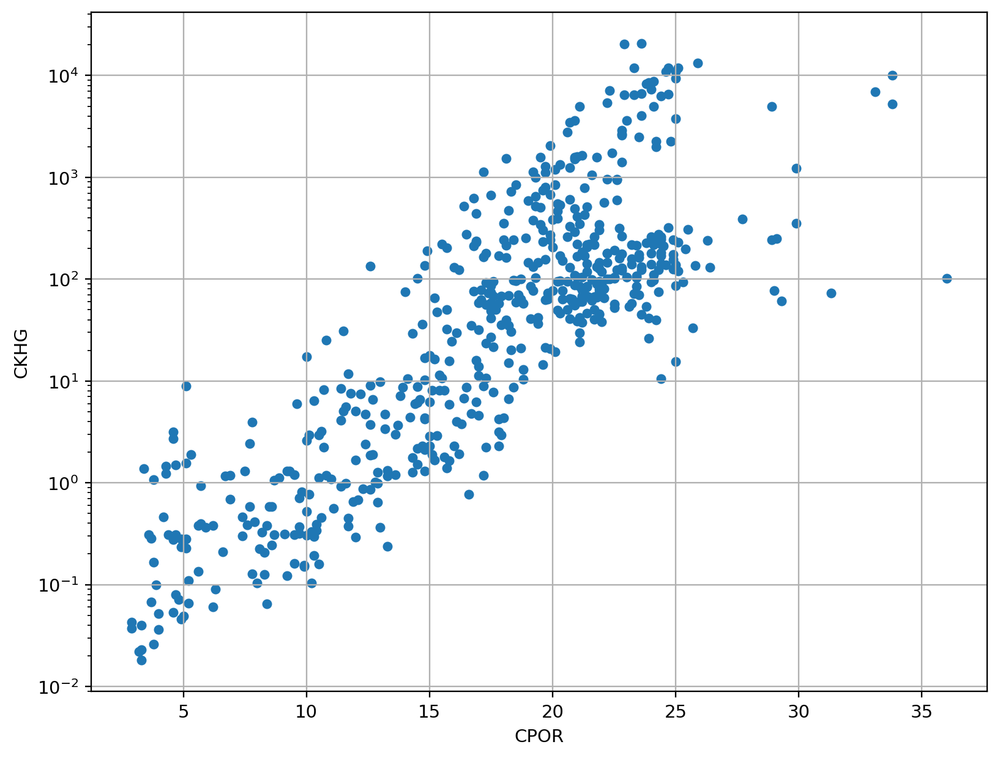

In [ ]:
core_data.plot(kind="scatter", x="CPOR", y="CKHG")
plt.yscale('log')
plt.grid(True)

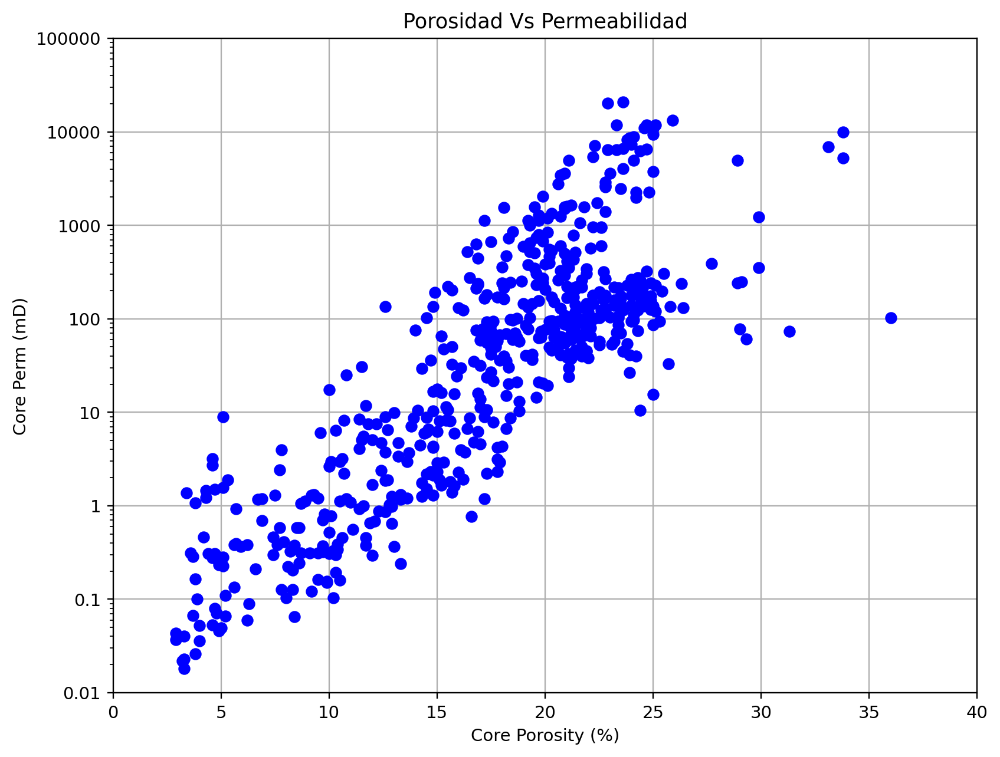

In [ ]:
from matplotlib.ticker import FuncFormatter
fig, ax = plt.subplots()
ax.axis([0, 40, 0.01, 100000])
ax.plot(core_data['CPOR'], core_data['CKHG'], 'bo')
ax.set_yscale('log')
ax.grid(True)
ax.set_ylabel('Core Perm (mD)')
ax.set_xlabel('Core Porosity (%)')
ax.set_title('Porosidad Vs Permeabilidad')
#Format the axes so that they show whole numbers
for axis in [ax.yaxis, ax.xaxis]:
    formatter = FuncFormatter(lambda y, _: '{:.16g}'.format(y))
    axis.set_major_formatter(formatter)

In [ ]:
 porosidad_promedio = core_data['CPOR'].mean()
 porosidad_promedio

16.829342327150076

In [ ]:
 permeabilidad_promedio = core_data['CKHG'].mean()
 permeabilidad_promedio

649.8014631956901

Para evitar dañar la data inicial se procede a hacer una copa de los datos para luego eliminar los datos en blanco y aquellos que salgan del rango.

**Analsiis de datos**

Regresion 
Correlacion de datos

Para ello es necesario hacer regresiones lineales. Dos metodos vistos en el curson saltan a la vista: Numphy (polyfit funtions o  statsmodels libreria.

In [ ]:
poro_perm.dropna(inplace=True)

In [ ]:
poro_perm_polyfit = np.polyfit(core_data['CPOR'], np.log10(core_data['CKHG']), 0 )


In [ ]:
x = core_data['CPOR']
x = sm.add_constant(x)
y = np.log10(core_data['CKHG'])
model = sm.OLS(y, x, missing='drop')
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   CKHG   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                     1340.
Date:                Fri, 17 Dec 2021   Prob (F-statistic):          4.26e-150
Time:                        16:55:21   Log-Likelihood:                -601.06
No. Observations:                 557   AIC:                             1206.
Df Residuals:                     555   BIC:                             1215.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5561      0.088    -17.768      0.000      -1.728      -1.384
CPOR           0.1743      0.005     36.602      0.000       0.165       0.184
==============================================================================
Omnibus:                        6.685   Durbin-Watson:                   0.853
Prob(Omnibus):                  0.035   Jarque-Bera (JB):                6.790
Skew:                           0.254   Prob(JB):                       0.0335
Kurtosis:                       2.816   Cond. No.                         53.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
results.params

const   -1.556078
CPOR     0.174287
dtype: float64

In [ ]:
results.params[1]

0.1742870473595356

Ahora podemos contruir la ecuacion

Permeabilidad=10^(0.174287*(Porosidad*100)-1.556078

La Ecuacion de Winland esta dada por:

R35= 0,732+0,588*LOG(Permeabilidad)-0,864*LOG(Porosidad)

Permeabilidad=10^((LOG(R35)+(0,864*LOG(Porosidad))-0,732)/0,588)

La cual es una ecuacion completamente empirica que realciona permeabilidad con Porosidad para hacer una subclasificion.

In [ ]:
ax.semilogy(core_data['CPOR'], 10**(results.params[1] * core_data['CPOR'] + results.params[0]), 'r-')

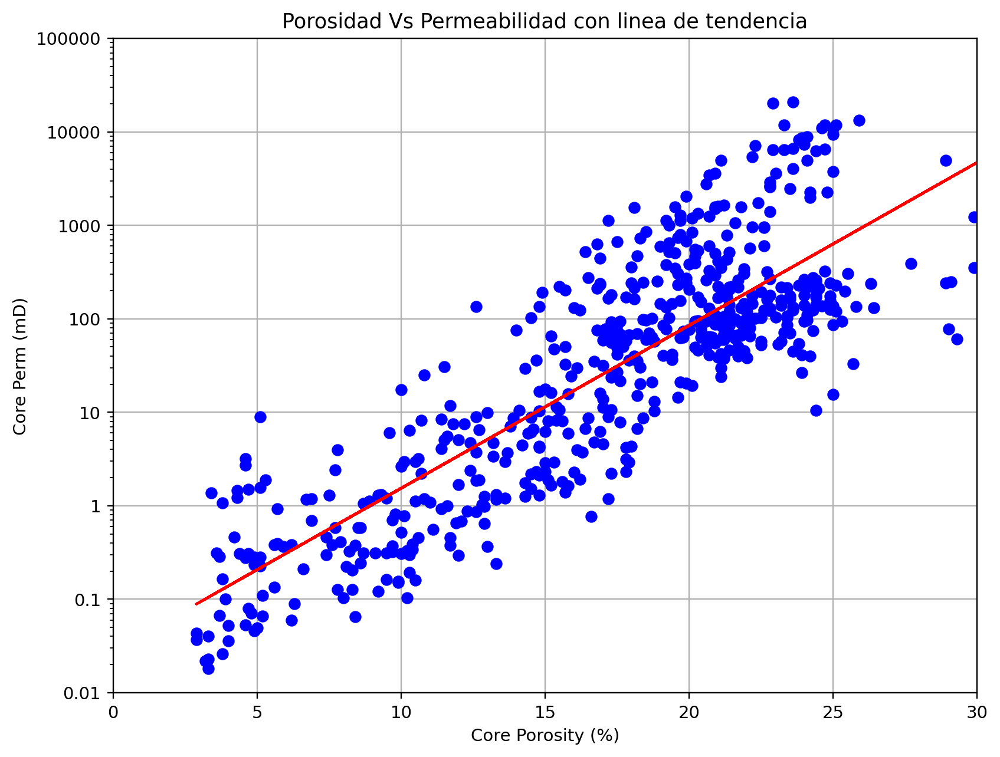

In [ ]:
from matplotlib.ticker import FuncFormatter
fig, ax = plt.subplots()
ax.axis([0, 30, 0.01, 100000])
ax.semilogy(core_data['CPOR'], core_data['CKHG'], 'bo')
ax.grid(True)
ax.set_ylabel('Core Perm (mD)')
ax.set_xlabel('Core Porosity (%)')
ax.set_title('Porosidad Vs Permeabilidad con linea de tendencia')
ax.semilogy(core_data['CPOR'], 10**(results.params[1] * core_data['CPOR'] + results.params[0]), 'r-')
#Format the axes so that they show whole numbers
for axis in [ax.yaxis, ax.xaxis]:
    formatter = FuncFormatter(lambda y, _: '{:.16g}'.format(y))
    axis.set_major_formatter(formatter)

Prediccion de la Permeabilidad desde regaistro electrico de Porosidad.

In [ ]:
well = pd.read_excel("15_9_19.xlsx")
well['PERM']= 10**(results.params[1] * (well['PHIT']*100) + results.params[0])
well.head()

,DEPTH,CALI,COAL,DT,DT_LOG,DTS,DTS_LOG,GR,NPHI,PHIE,PHIEC,PHIT,PHITC,RHOB,RHOB_LOG,RT,RW,TEMP,PERM
0,3500.0183,9315.0,0,767292.0,767292.0,1571754.0,1571754.0,36621.0,0.1542,0.1122,0.1098,0.1209,0.1186,24602.0,2.46,1791.00,0.0211,945855.0,3.556741
1,3500.1707,9324.0,0,772473.0,772473.0,1589566.0,1589566.0,36374.0,0.1694,0.1074,0.1060,0.1159,0.1146,2468.0,2468.00,1756.00,0.0211,945897.0,2.910105
2,3500.3231,9338.0,0,778462.0,778462.0,1597642.0,1597642.0,30748.0,0.1776,0.1082,0.1079,0.1127,0.1125,2473.0,2473.00,1.72,0.0211,94594.0,2.559392
3,3500.4755,9329.0,0,783571.0,783571.0,1587547.0,1587547.0,29795.0,0.1767,0.1254,0.1226,0.1292,0.1264,24471.0,2447.00,1696.00,0.0211,945982.0,4.962614
4,3500.6279,9328.0,0,78656.0,78656.0,157132.0,157132.0,27346.0,0.1662,0.1278,0.1249,0.1299,0.1270,2446.0,2446.00,1697.00,0.0211,946025.0,5.103999


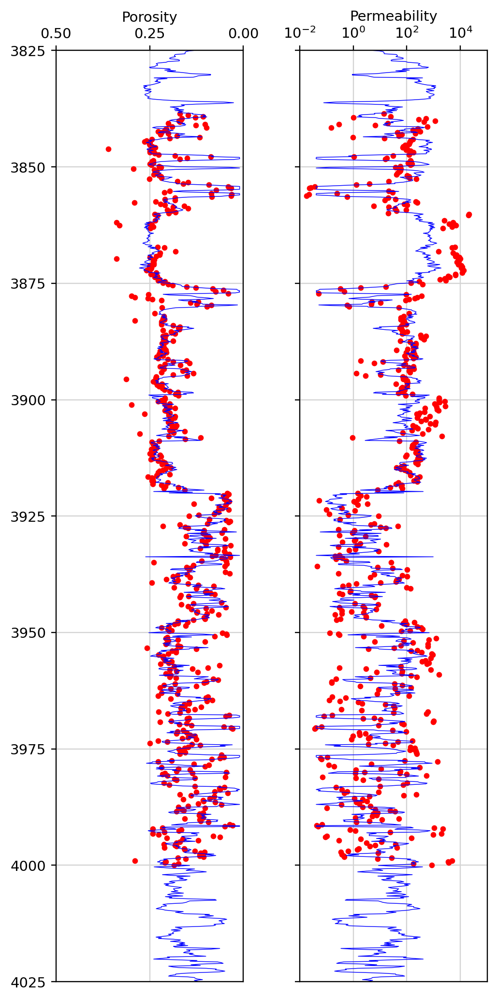

In [ ]:
fig, ax = plt.subplots(figsize=(5,10))
ax1 = plt.subplot2grid((1,2), (0,0), rowspan=1,colspan = 1 )
ax2 = plt.subplot2grid((1,2), (0,1), rowspan=1, colspan = 1, sharey = ax1)
# Porosity track
ax1.plot(core_data["CPOR"]/100, core_data['DEPTH'], color = "red", marker='.', linewidth=0)
ax1.plot(well['PHIT'], well['DEPTH'], color ='blue', linestyle='solid', linewidth=0.5)
ax1.set_xlabel("Porosity")
ax1.set_xlim(0.5, 0)
ax1.xaxis.label.set_color("black")
ax1.tick_params(axis='x', colors="black")
ax1.spines["top"].set_edgecolor("black")
ax1.set_xticks([0.5,  0.25, 0])
# Permeability track
ax2.plot(core_data["CKHG"], core_data['DEPTH'], color = "red", marker='.', linewidth=0)
ax2.plot(well['PERM'], well['DEPTH'], color ='blue', linestyle='solid', linewidth=0.5)
ax2.set_xlabel("Permeability")
ax2.set_xlim(0.1, 100000)
ax2.xaxis.label.set_color("black")
ax2.tick_params(axis='x', colors="black")
ax2.spines["top"].set_edgecolor("black")
ax2.set_xticks([0.01, 1, 10, 100, 10000])
ax2.semilogx()
# Common functions for setting up the plot can be extracted into
# a for loop. This saves repeating code.
for ax in [ax1, ax2]:
    ax.set_ylim(4025, 3825)
    ax.grid(which='major', color='lightgrey', linestyle='-')
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")
    
# Removes the y axis labels on the second track
for ax in [ax2]:
    plt.setp(ax.get_yticklabels(), visible = False)
    
plt.tight_layout()
fig.subplots_adjust(wspace = 0.3)

Ahora miremos la relacion de Winland.

In [ ]:
well1 = pd.read_excel("tipo R W.xlsx")
well1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Porosity1    53 non-null     int64  
 1   Perm1        53 non-null     float64
 2   Porosity2    53 non-null     int64  
 3   Perm2        53 non-null     float64
 4   Porosity5    53 non-null     int64  
 5   Perm5        53 non-null     float64
 6   Porosity10   53 non-null     int64  
 7   Perm10       53 non-null     float64
 8   Porosity20   53 non-null     int64  
 9   Perm20       53 non-null     float64
 10  Porosity25   53 non-null     int64  
 11  Perm25       53 non-null     float64
 12  Porosity30   53 non-null     int64  
 13  Perm30       53 non-null     float64
 14  Porosity40   53 non-null     int64  
 15  Perm40       53 non-null     float64
 16  Porosity90   53 non-null     int64  
 17  Perm90       53 non-null     float64
 18  Porosity120  53 non-null     int64  
 19  Perm120   

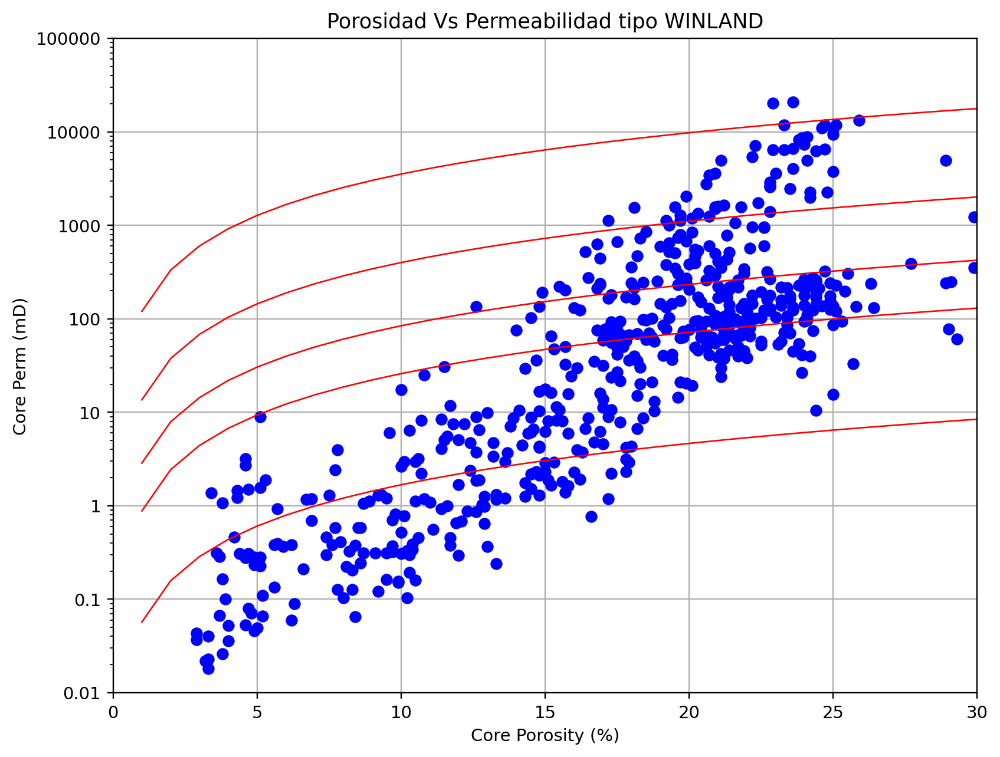

In [ ]:
from matplotlib.ticker import FuncFormatter
fig, ax = plt.subplots()
ax.axis([0, 30, 0.01, 100000])
ax.semilogy(core_data['CPOR'], core_data['CKHG'], 'bo')
ax.semilogy(well1['Porosity1'], well1['Perm1'], color ='red', linestyle='solid', linewidth=0.9, )
ax.semilogy(well1['Porosity5'], well1['Perm5'], color ='red', linestyle='solid', linewidth=0.9, )
ax.semilogy(well1['Porosity10'], well1['Perm10'], color ='red', linestyle='solid', linewidth=0.9, )
ax.semilogy(well1['Porosity25'], well1['Perm25'], color ='red', linestyle='solid', linewidth=0.9, )
#ax.semilogy(well1['Porosity40'], well1['Perm40'], color ='red', linestyle='solid', linewidth=0.9, )
ax.semilogy(well1['Porosity90'], well1['Perm90'], color ='red', linestyle='solid', linewidth=0.9, )
#ax.semilogy(well1['Porosity120'], well1['Perm120'], color ='red', linestyle='solid', linewidth=0.9, )
ax.grid(True)
ax.set_ylabel('Core Perm (mD)')
ax.set_xlabel('Core Porosity (%)')
ax.set_title('Porosidad Vs Permeabilidad tipo WINLAND')
#ax.semilogy(core_data['CPOR'], 10**(results.params[1] * core_data['CPOR'] + results.params[0]), 'r-')
#Format the axes so that they show whole numbers
for axis in [ax.yaxis, ax.xaxis]:
    formatter = FuncFormatter(lambda y, _: '{:.16g}'.format(y))
    axis.set_major_formatter(formatter)

**Analisis**

<p align = "justify">El uso de Phyton permitió optimizar exageradamente procesos que antes realizábamos en Excel. Adicionalmente ahora se tiene un control sobre los datos que no tenemos como por ejemplo fue la selección de la mejor medida de permeabilidad relacionada a la porosidad. Pudimos replicar los cálculos de windland con una mejora sustancial, ya que ahora no es solo una grafica, sino datos que podemos manipular y entender y dividir por grupos que son fácilmente atribuidos a zonas de interés.Esto se puede utilizar posteriormente en modelos geológicos o simulaciones de yacimientos.

**Aplicacion de Centroides para resolver Tipos de Roca de Windland**


<p align = "justify">La agrupación en clústeres de K-means es uno de los algoritmos de aprendizaje automático no supervisados ​​más simples y populares.
Por lo general, los algoritmos no supervisados ​​hacen inferencias a partir de conjuntos de datos utilizando solo vectores de entrada sin hacer referencia a resultados conocidos o etiquetados.
Un grupo se refiere a una colección de puntos de datos agregados debido a ciertas similitudes.
Definirás un número objetivo k, que se refiere al número de centroides que necesitas en el conjunto de datos. Un centroide es la ubicación imaginaria o real que representa el centro del grupo.
Cada punto de datos se asigna a cada uno de los grupos mediante la reducción de la suma de cuadrados dentro del grupo.
En otras palabras, el algoritmo de K-medias identifica k número de centroides y luego asigna cada punto de datos al grupo más cercano, mientras mantiene los centroides lo más pequeños posible.
Los "medios" en los K-medias se refieren al promedio de los datos; es decir, encontrar el centroide.
El punto es que la agrupación en tipos de roca sigue una curva en particular que es llamada el R35, que básicamente mantiene la relación entre la porosidad y la permeabilidad, por lo tanto puede existir 2 puntos muy distantes que pertenezcan al mismo tipo de roca. De surge la pregunta si es necesario crear mas tipos de roca y luego unir los que tienen la tendría de la gráfica o será necesario usar otro método.

<p align = "justify">Importamos el archivo excel con una selección previa de los tipos de roca con la finalidad de entrenar el modelo en busca de una alternativa mas óptima para la clasificación de los tipos de roca de Windland

In [ ]:
Tipo_roca = pd.read_excel("RT_final.xlsx")
Tipo_roca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 557 entries, 0 to 556
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   DEPTH      557 non-null    float64
 1   CKHG       557 non-null    float64
 2   CPOR       557 non-null    float64
 3   TR         557 non-null    int64  
 4   Formacion  557 non-null    object 
 5   R35        557 non-null    float64
dtypes: float64(4), int64(1), object(1)
memory usage: 26.2+ KB


In [ ]:
Tipo_roca.head()

,DEPTH,CKHG,CPOR,TR,Formacion,R35
0,3838.60,13.80,17.0,3,A,2.183439
1,3839.15,25.20,10.8,3,A,4.604107
2,3839.40,1.02,12.8,5,A,0.603153
3,3839.60,524.00,16.4,1,A,19.113566
4,3839.85,274.00,16.5,1,A,12.986473


In [ ]:
print (Tipo_roca['Formacion'])

0      A
1      A
2      A
3      A
4      A
      ..
552    B
553    B
554    B
555    B
556    B
Name: Formacion, Length: 557, dtype: object


Este archivo cuenta con 6 columnas donde se define:

 Profundidad = DEPTH

 Permeabilidad = CKHG

 Porosidad = CPOR

 Tipo de Roca = TR 

 Formacion = Formacion 
 
 Winland_R35 = R35 

# Convertimos todo a la forma numerica

In [ ]:
def decodificar(Tipo_roca):

    yformacion = np.array(Tipo_roca['Formacion'])
    y_num = np.array(list(map(lambda x:1 if x == 'A' else 0, yformacion)))

    X1 = Tipo_roca.drop(columns=['Formacion'], axis = 1)
    X1['Formacion'] = y_num
    Tipo_roca_dec = X1

    return Tipo_roca_dec

In [ ]:
 Tipo_roca_dec = decodificar(Tipo_roca)

print(Tipo_roca_dec[:5])

     DEPTH    CKHG  CPOR  TR        R35  Formacion
0  3838.60   13.80  17.0   3   2.183439          1
1  3839.15   25.20  10.8   3   4.604107          1
2  3839.40    1.02  12.8   5   0.603153          1
3  3839.60  524.00  16.4   1  19.113566          1
4  3839.85  274.00  16.5   1  12.986473          1


Se ordenan los datos para importar en SKLEARN

In [ ]:
def separar_X_y(X):
  """
    Entradas:
      Tipo_roca: objeto DataFrame del conjunto de datos de Porosidad y Permeabilidad.
    Retorna:
      X: objeto DataFrame con la matriz de datos de entrada.
      y: objeto Series con el vector de etiquetas reales.
      
      X debe ser un DataFrame y y una Series de Pandas.
  """
  ### ESCRIBA SU CÓDIGO AQUÍ ### (~ 2 líneas de código)

  X = X.drop(columns=['TR'], axis = 1)
  y = Tipo_roca['TR']

  ### FIN DEL CÓDIGO ###

  return X, y

In [ ]:
X, y = separar_X_y(Tipo_roca_dec)

print(f'Tamaño de X: {X.shape}')
print(f'Tamaño de y: {y.shape}')

Tamaño de X: (557, 5)
Tamaño de y: (557,)


Se mira la distribucion de los tipos de Roca

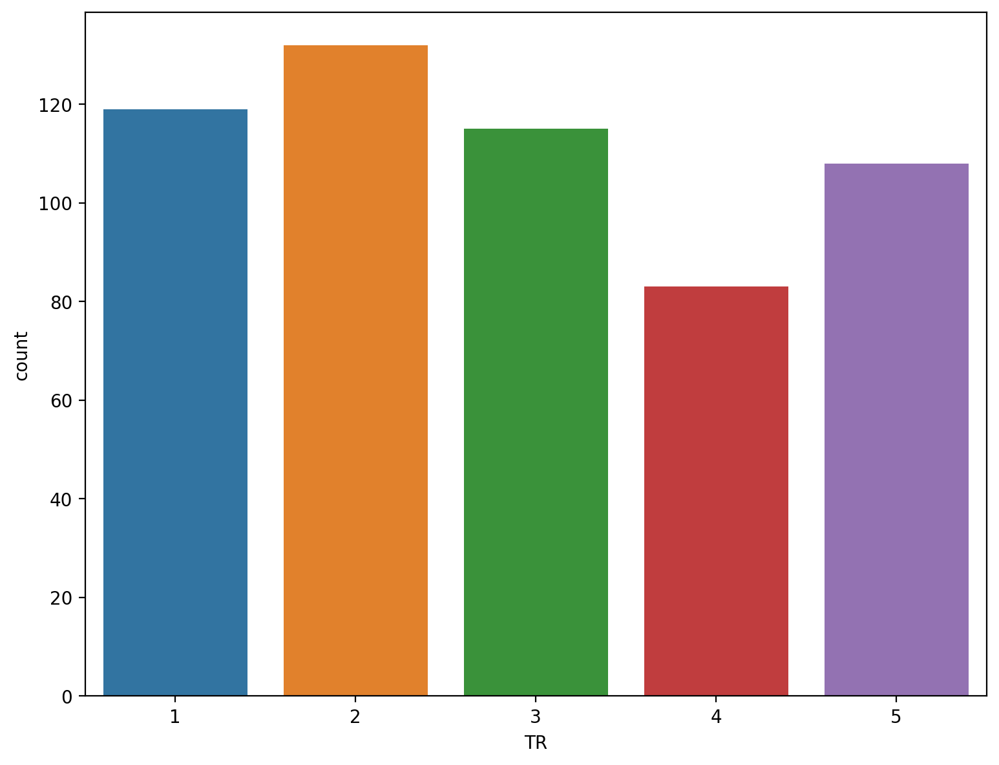

In [ ]:
plt.figure(dpi=100)
sns.countplot(x = y);

In [ ]:
# FUNCIÓN CALIFICADA get_stratified_split:

# Módulo necesario para realizar el ejercicio.
from sklearn import model_selection

def get_stratified_split(X, y, 
              p=0.3, random_state=24): 
  """
    X: matriz de datos, arreglo de NumPy con shape (n, m).
    y: vector de etiquetas, arreglo de NumPy con shape (n,).
    p: proporción de los datos para la partición de prueba,
       número real entre 0 y 1.
    random_state: semilla aleatoria.

  Retorna: 
    X_train: arreglo de NumPy con shape aproximado (n(1 - p), m) 
              para la partición de entrenamiento de X.
    X_test:  arreglo de NumPy con shape aproximado (n(p), m) 
              para la partición de prueba de X.
    y_train: arreglo de NumPy con shape aproximado (n(1 - p),) 
              para la partición de entrenamiento de y.
    y_test:  arreglo de NumPy con shape aproximado (n(p),) 
              para la partición de prueba de y.
  """
  ### ESCRIBA SU CÓDIGO AQUÍ ### (~ 2 líneas de código)
 
  X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=p,  stratify=y, random_state=random_state)
  
  
  ### FIN DEL CÓDIGO ###

  return X_train, X_test, y_train, y_test

In [ ]:
X_train, X_test, y_train, y_test = get_stratified_split(X, y)

In [ ]:
  print('\nI. Partición de entrenamiento:\n')

  print(f"Tamaño de X: {X_train.shape}")
  print(f"\nPrimeros 5 valores de X:\n")
  print(X_train[:5])

  print('\nII. Partición de prueba:\n')
  print(f"Tamaño de X: {X_test.shape} \n")

  print(f"Primeros 5 valores de X:\n")
  print(X_test[:5])



I. Partición de entrenamiento:

Tamaño de X: (389, 5)

Primeros 5 valores de X:

       DEPTH     CKHG  CPOR       R35  Formacion
53   3852.10  119.000  22.0  6.202523          1
474  3978.75    0.193  10.3  0.273411          0
469  3977.25    0.065   8.4  0.171955          0
297  3927.15   46.100  21.4  3.637296          0
444  3970.50    0.040   3.3  0.289745          0

II. Partición de prueba:

Tamaño de X: (168, 5) 

Primeros 5 valores de X:

       DEPTH      CKHG  CPOR        R35  Formacion
494  3984.30     8.990  12.6   2.198318          0
109  3873.00  6520.000  24.7  59.086385          1
281  3920.80     3.170   4.6   2.844462          0
249  3911.60   243.000  24.9   8.480476          1
319  3934.25     0.233   4.9   0.580331          0


# Se prueba los resultados con Kmeans

In [ ]:
# Métodos de agrupamiento - Algoritmo K-means
from sklearn.cluster import KMeans

# Número de clusters que se desea generar.
n = 5    
X_cluster = Tipo_roca_dec[['R35', 'DEPTH' ]].values
km = KMeans(n_clusters = n)
km.fit(X_cluster)

y = km.predict(X_cluster)
y.shape

(557,)

In [ ]:
km.cluster_centers_

array([[   4.4025105 , 3942.33308824],
       [   8.8532999 , 3897.22621951],
       [   5.00172782, 3981.58556338],
       [   5.26824481, 3849.24634146],
       [  64.47419074, 3868.71060606]])

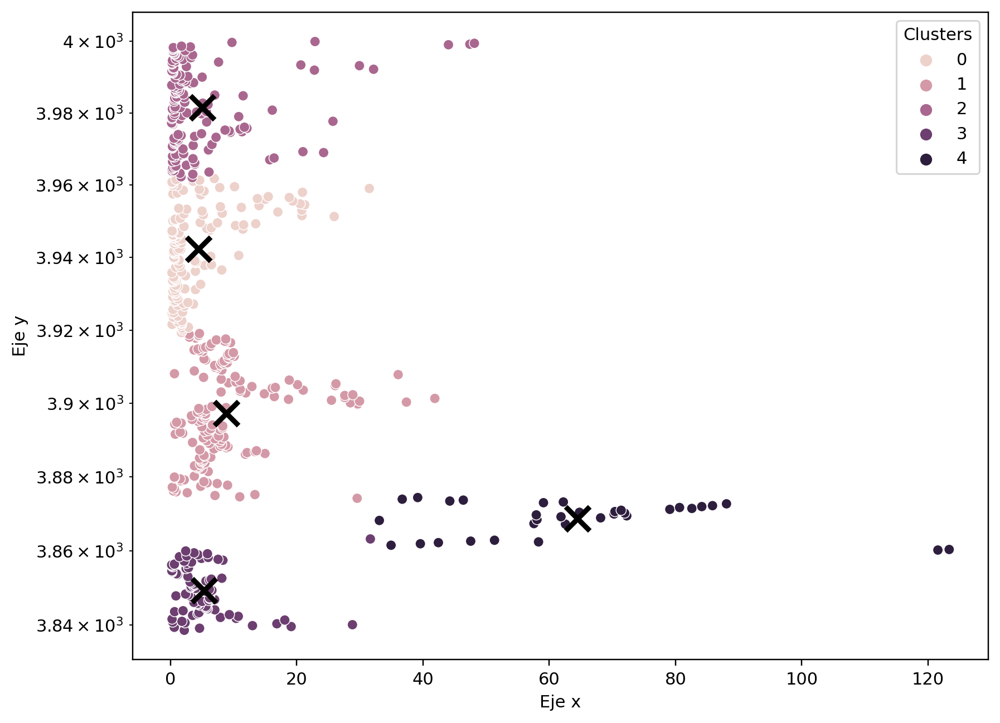

In [ ]:
import matplotlib.pyplot as plt
plt.figure(dpi = 110)
splot= sns.scatterplot(x = X_cluster[:,0], y = X_cluster[:,1], hue = y)
splot.set(yscale="log")
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,1], 
            marker="x", lw=3, s=200, color = 'k')

plt.legend(title = 'Clusters'); plt.xlabel("Eje x"); plt.ylabel("Eje y");



Al mirar los resultados K-means no es la mejor manera de resolver este ejercicio porque necesita un metodo de aprendizaje supervisado.

In [ ]:
import graphviz 

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

# Árboles de Decisión

In [ ]:
    columna_formacion_original = Tipo_roca['Formacion']
    columna_formacion_pre_procced = np.array(list(map(lambda x:1 if x == 'A' else 0, columna_formacion_original)))

    Dataframe_pre_procced = Tipo_roca.drop(columns=['Formacion', 'R35'], axis = 1)
    Dataframe_pre_procced['Formacion'] = columna_formacion_pre_procced
    Dataframe_pre_procced.head()

,DEPTH,CKHG,CPOR,TR,Formacion
0,3838.60,13.80,17.0,3,1
1,3839.15,25.20,10.8,3,1
2,3839.40,1.02,12.8,5,1
3,3839.60,524.00,16.4,1,1
4,3839.85,274.00,16.5,1,1


In [ ]:
feature = Dataframe_pre_procced.drop(['TR'],axis=1)
print(feature.head())
X=np.array(feature)

etiquetas = Dataframe_pre_procced['TR']
print(etiquetas.head())
y=np.array(etiquetas)

     DEPTH    CKHG  CPOR  Formacion
0  3838.60   13.80  17.0          1
1  3839.15   25.20  10.8          1
2  3839.40    1.02  12.8          1
3  3839.60  524.00  16.4          1
4  3839.85  274.00  16.5          1
0    3
1    3
2    5
3    1
4    1
Name: TR, dtype: int64


In [ ]:
# FUNCIÓN CALIFICADA get_stratified_split:

from sklearn import model_selection
 
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.3,  stratify=y, random_state=42)

In [ ]:
from sklearn import model_selection

def tree_grid_search(X_train, y_train, param_grid, k,
# ¡No modifique los valores por defecto de los argumentos!
                seed = 333):
  """
  Entradas:
    X_train: Arreglo de NumPy con shape (n, m),
    y_train: Arreglo de NumPy con shape (n,).
    param_grid: Hiperparámetros a explorar.
    k: Número de pliegues de validación cruzada
    seed: semilla aleatoria para la creación de la partición.
  Retorna:
    gsearch: GridSearchCV entrenado con X_train y y_train.
  """ 
  ### ESCRIBA SU CÓDIGO AQUÍ ### (~ 3-4 líneas de código)

  # Declare el clasificador base del modelo basado en árboles de decisión.
  # IMPORTANTE: Fije la seed aleatoria con el argumento 'random_state'.
  tree_clf = tree.DecisionTreeClassifier(random_state=2)
 

  # Creación del objeto GridSearchCV, que puede ser entrenado.
  gridSearchModel = model_selection.GridSearchCV(  estimator = tree_clf ,
                                                    param_grid=param_grid,
                                                    #verbose=1,  #Al comentar esta línea evitamos que envíe el detalle del objeto Grid Search.
                                                    cv = k,
                                                    return_train_score=True
                                                )

  # Declare y entrene el objeto GridSearchCV.
  gsearch = gridSearchModel.fit(X_train, y_train)
 
  ### FIN DEL CÓDIGO ###
 
  return gsearch


|--- feature_1 <= 67.60
|   |--- feature_1 <= 2.02
|   |   |--- feature_1 <= 1.04
|   |   |   |--- feature_2 <= 4.30
|   |   |   |   |--- feature_1 <= 0.22
|   |   |   |   |   |--- class: 5
|   |   |   |   |--- feature_1 >  0.22
|   |   |   |   |   |--- class: 4
|   |   |   |--- feature_2 >  4.30
|   |   |   |   |--- feature_1 <= 0.69
|   |   |   |   |   |--- class: 5
|   |   |   |   |--- feature_1 >  0.69
|   |   |   |   |   |--- feature_2 <= 8.30
|   |   |   |   |   |   |--- class: 4
|   |   |   |   |   |--- feature_2 >  8.30
|   |   |   |   |   |   |--- class: 5
|   |   |--- feature_1 >  1.04
|   |   |   |--- feature_2 <= 12.80
|   |   |   |   |--- feature_2 <= 10.00
|   |   |   |   |   |--- feature_2 <= 3.60
|   |   |   |   |   |   |--- class: 3
|   |   |   |   |   |--- feature_2 >  3.60
|   |   |   |   |   |   |--- class: 4
|   |   |   |   |--- feature_2 >  10.00
|   |   |   |   |   |--- feature_1 <= 1.44
|   |   |   |   |   |   |--- class: 5
|   |   |   |   |   |--- feature_1 >  

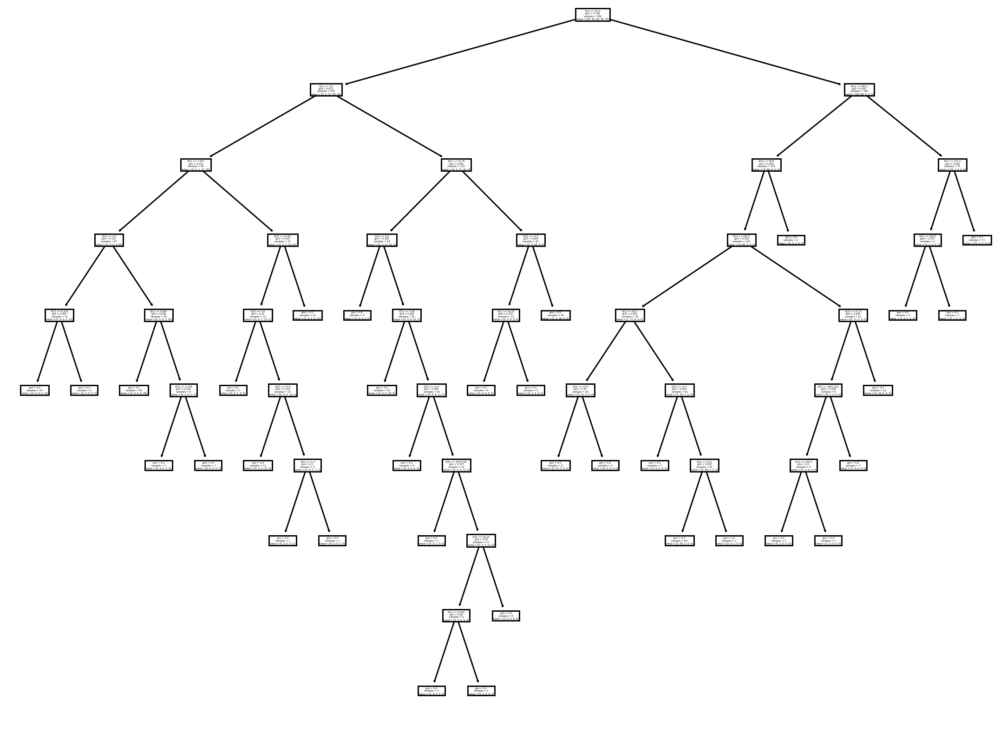

In [ ]:
from sklearn import tree
clf = tree.DecisionTreeClassifier(random_state=2)
clf = clf.fit(X_train, y_train)
tree.plot_tree(clf)
text_representation = tree.export_text(RT_DT_classifier)
print(text_representation)

In [ ]:

#TEST_CELL
from sklearn import datasets

#Parametros para explorar la profundidad del arbol
param_grid = {
    "max_depth": range(5, 60, 1),    # Profundidad máxima del árbol de decisión.
    "criterion": ["gini", "entropy"], # Criterio de partición del árbol.
  }

gsearch = tree_grid_search(X, y, param_grid, k=3)

if gsearch is not None:
  print(f'Mejores hiperparámetros:\n {gsearch.best_params_}')
  print(f'Mejor exactitud (validación): {gsearch.best_score_:.6f}')
else: print('El valor retornado no es un clasificador GridSearchCV válido.')

Mejores hiperparámetros:
 {'criterion': 'entropy', 'max_depth': 8}
Mejor exactitud (validación): 0.797133


In [ ]:
# FUNCIÓN CALIFICADA tree_performance_metrics:

# Módulos necesarios para realizar el ejercicio.
from sklearn import metrics

def tree_performance_metrics(gsearch, X_test, y_test):
  """
  Entradas:
    gsearch: Modelo entrenado con GridSearchCV
    X_digits_test: Arreglo de numpy con shape (n, m)
    y_digits_test: Arreglo de numpy con shape (n,)
  Retorna: 
    accuracy: exactitud en prueba.
    precision_macro: precisión macro en prueba.
    recall_macro: recall macro en prueba.
    f1_macro: f1 score macro en prueba.     
  """
  ### ESCRIBA SU CÓDIGO AQUÍ ### (~ 6-7 líneas de código)
 
 
  #1) - Ejecuta la predicción de 'y' según el modelo entrenado que ingresa por parametro
  y_pred = gsearch.predict(X_test)

  #2) - Calculo de métricas
  precision_macro = metrics.precision_score(y_test, y_pred, average = 'macro')
  recall_macro = metrics.recall_score(y_test, y_pred, average = 'macro')
  f1_macro = metrics.f1_score(y_test, y_pred, average = 'macro')

  #3) - Calcula la presición del modelo. Puede usar la función score ya que es el modelo gsearch es un objeto "grid search"
  accuracy = gsearch.score(X_test, y_test)

  ### FIN DEL CÓDIGO ###

  return accuracy, precision_macro, recall_macro, f1_macro

In [ ]:
# prueba del modelo según las metricas.
from numbers import Number

acc, prec, rec, f1 = tree_performance_metrics(gsearch, X_test, y_test)

print(f'Exactitud en prueba: {acc:.6f}' if isinstance(acc, Number) else 'La exactitud no es válida.')
print(f'Precisión macro en prueba: {prec:.6f}' if isinstance(prec, Number) else 'La precisión macro no es válida.')
print(f'Recall macro en prueba: {rec:.6f}' if isinstance(rec, Number) else 'El recall macro no es válido.')
print(f'F1 macro en prueba: {f1:.6f}' if isinstance(f1, Number) else 'El f1 macro no es válido.')

Exactitud en prueba: 1.000000
Precisión macro en prueba: 1.000000
Recall macro en prueba: 1.000000
F1 macro en prueba: 1.000000


In [ ]:
# FUNCION PARA EJECUTAR LA PREDICCIÓN DEL MODELO:

def ejecuta_prediccion(gsearch_model, X_prueba):
 
  #1) - Ejecuta la predicción de 'y' según el modelo entrenado que ingresa por parametro
  y_pred = gsearch.predict(X_prueba)

  return y_pred

In [ ]:
y_prediccion = ejecuta_prediccion(gsearch, X_test)
y_prediccion

array([5, 4, 2, 5, 5, 5, 4, 2, 5, 1, 4, 3, 5, 4, 1, 5, 2, 5, 1, 3, 3, 3,
       3, 5, 5, 2, 2, 1, 2, 5, 4, 2, 1, 2, 3, 1, 2, 1, 5, 2, 2, 5, 3, 5,
       1, 3, 3, 4, 2, 3, 2, 3, 3, 1, 1, 3, 3, 3, 1, 1, 5, 4, 2, 4, 5, 2,
       1, 2, 1, 5, 5, 4, 3, 2, 2, 4, 1, 1, 4, 1, 5, 2, 1, 3, 2, 3, 4, 1,
       3, 2, 3, 1, 4, 5, 4, 3, 5, 5, 3, 4, 1, 3, 1, 5, 1, 2, 3, 3, 4, 1,
       5, 2, 5, 1, 3, 2, 1, 4, 2, 4, 3, 2, 3, 2, 2, 2, 2, 3, 3, 5, 1, 1,
       2, 3, 2, 2, 3, 5, 1, 4, 5, 1, 1, 4, 1, 3, 3, 5, 4, 2, 2, 2, 5, 3,
       1, 2, 5, 4, 1, 1, 2, 4, 5, 2, 4, 2, 1, 4])

In [ ]:
y_test

array([5, 4, 2, 5, 5, 5, 4, 2, 5, 1, 4, 3, 5, 4, 1, 5, 2, 5, 1, 3, 3, 3,
       3, 5, 5, 2, 2, 1, 2, 5, 4, 2, 1, 2, 3, 1, 2, 1, 5, 2, 2, 5, 3, 5,
       1, 3, 3, 4, 2, 3, 2, 3, 3, 1, 1, 3, 3, 3, 1, 1, 5, 4, 2, 4, 5, 2,
       1, 2, 1, 5, 5, 4, 3, 2, 2, 4, 1, 1, 4, 1, 5, 2, 1, 3, 2, 3, 4, 1,
       3, 2, 3, 1, 4, 5, 4, 3, 5, 5, 3, 4, 1, 3, 1, 5, 1, 2, 3, 3, 4, 1,
       5, 2, 5, 1, 3, 2, 1, 4, 2, 4, 3, 2, 3, 2, 2, 2, 2, 3, 3, 5, 1, 1,
       2, 3, 2, 2, 3, 5, 1, 4, 5, 1, 1, 4, 1, 3, 3, 5, 4, 2, 2, 2, 5, 3,
       1, 2, 5, 4, 1, 1, 2, 4, 5, 2, 4, 2, 1, 4])

In [ ]:
# Importamos el constructor del clasificador por árboles de decisión.
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier()

In [ ]:
# Entrenamos el modelo con el conjunto de datos Tipos de Roca.

RT_DT_classifier =  DecisionTreeClassifier(random_state=2)
RT_DT_classifier = RT_DT_classifier.fit(X, y)
print (RT_DT_classifier)

DecisionTreeClassifier(random_state=2)


**A CONTINUACION UN ANALISIS DE DATOS USANDO BIG DATA TOOLS**

1. Definicion de la propuesta

<p align = "justify">Cuando hacemos analisis de porosidad y permeabilidad con datos de nucleo estamos hablando de 40-100 puntos de datos lo cual es facilmente manejable con las tecnicas anteriores, pero cuando usamos registros electricos ese valor aumenta a mas de 4000 mediciones por pozo, y si en un area tenemos 500 pozos estamos hablado de mas de 2000.000 mediciones y cada una con al menos 10 datos, son 2 millones de datos. Por eso se hace necesario buscar una forma mas facil de manejar esa cantidad de informacion.

 Arquitectura de la solucion:

<p align = "justify">Se hara el manejo de 4000 datos de un pozo con Hbase para obtener de forma rapida resultados para cada zona y ver si se puede clasificar en base a cut off de permeablidad y porosidad rapidamente los resultados.

2. El conjunto de datos fue tomado de https://www.andymcdonald.scot/blog/2021/2021-06-07-public-datasets-for-geoscience-and-petrophysics/

<p align = "justify">De alli se puede descargar informacion libre de pozos para practicar. los datos son bajados en formato excel e importados dentro de database.
Este conjunto de datos tiene las siguientes categorias:

DEPTH = Profundidad

CALI	= anchura del hueco o caliper

COAL	= carbon

DT	= tiempo de transito de la onda

DT_LOG	= logaritmo del tiempo de transito

DTS	= porosidad de transito

DTS_LOG	= lograritmo de la porosidad de transito

GR = gamma ray

NPHI	= porosidad neutron

PHIE	= porosidad efectiva

PHIEC	= porosidad efectiva corregida

PHIT	= porosidad total

PHITC	= porosidad total corregida

RHOB	= dendidad

RHOB_LOG	= registro de densidad

RT	= Resistividad total

RW	= Resistividad del Agua

TEMP = Temperatura


**Definicion de la tecnologia a implementar**

**HBASE**

<p align = "justify">HBase es un sistema gestor de base de datos distribuida no relacional de código abierto modelada a partir de Google BigTable y escrita en Java. Su desarrollo forma parte del proyecto Hadoop de la Fundación de Software Apache y se ejecuta sobre HDFS (el sistema de archivos distribuidos de Hadoop), proporcionando capacidades al estilos de BigTable para Hadoop. Es decir, proporciona una forma tolerante de fallos de almacenar grandes cantidades de datos dispersos (pequeñas cantidades de información inmersas dentro de una gran colección de datos inexistentes o poco significativos, tales como la búsqueda de los 50 mayores elementos en un grupo de 2 mil millones de registros, o la búsqueda de elementos distintos de cero que representan menos del 0,1% de una enorme colección).

<p align = "justify">HBase incluye operaciones de compresión en memoria, y filtro de Bloom sobre la base de cada columna como se propone en el artículo original sobre BigTable.1​ Las tablas en HBase pueden servir como entrada o salida para tareas MapReduce en Hadoop, y se puede acceder a través del API en Java, como servicio REST, o con los API de conexión Avro y Thrift. Hbase es un almacén de datos orientado a columnas de tipo clave-valor y basado en Hadoop y HDFS. HBase se ejecuta sobre HDFS y es adecuado para acelerar operaciones de lectura y escritura en los grandes conjuntos de datos con un alto rendimiento y una baja latencia de entrada/salida.2​

<p align = "justify">HBase no remplaza las bases de datos SQL clásicas, sin embargo el proyecto Apache Phoenix proporciona una capa de SQL para Hbase así como acceso vía el API JDBC que puede ser integrado con diversas herramientas de analítica de datos e inteligencia de negocios. El proyecto Apache Trafodion proporciona un motor de consulta SQL con drivers ODBC y JDBC y protección de transacciones ACID distribuidas a través de múltiples consultas, tablas y filas utilizando HBase como motor de almacenamiento.

<p align = "justify">Actualmente, Hbase se utiliza en sitios web orientados a datos,3​ incluyendo la plataforma de mensajería de Facebook.4​5​ A diferencia de las bases de datos relacionales tradicionales, HBase no da soporte a consultas SQL sino a scripts escritos en Java que emplean un motor de cálculo similar a MapReduce.2​

**Descripcion de la implementacion realizada**

<p align = "justify">Se van agrupar los datos de manera tal de obtener rapidamento los puntos que esten en ciertos rangos de porosidad y resitividad. De esta forma podremos claficar los datos al menos en 5 campos. Luego se entrara a cada grupo pára hacer  promedios y clasificar con respectoa los demas en un orden.

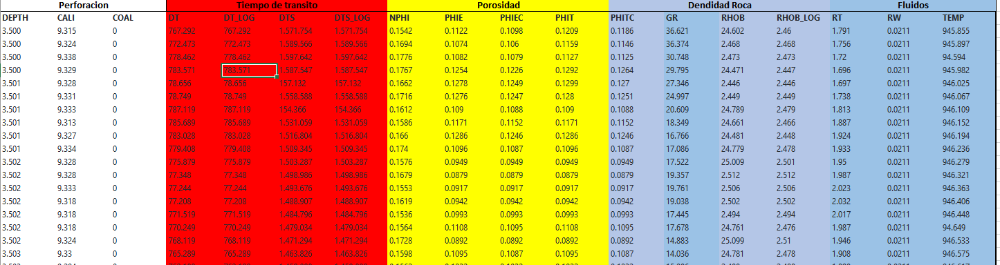


**Resultados y Analisis**

Lo mas complicado fue la carga de la informacion en HBASE. Para ello se utilizo pasaron a script pudiendo cargar mas de 4000 datos que reposan en la maquina virtual.

Creacion de la Base de datos

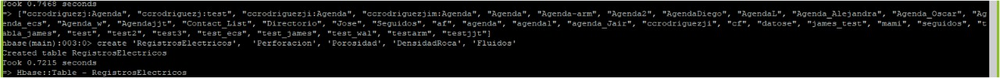


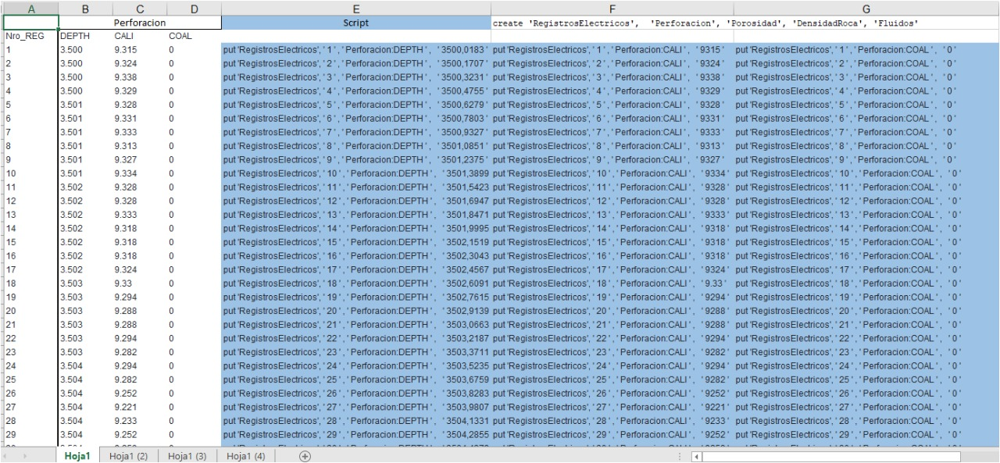

**Scrip de la porosidad**

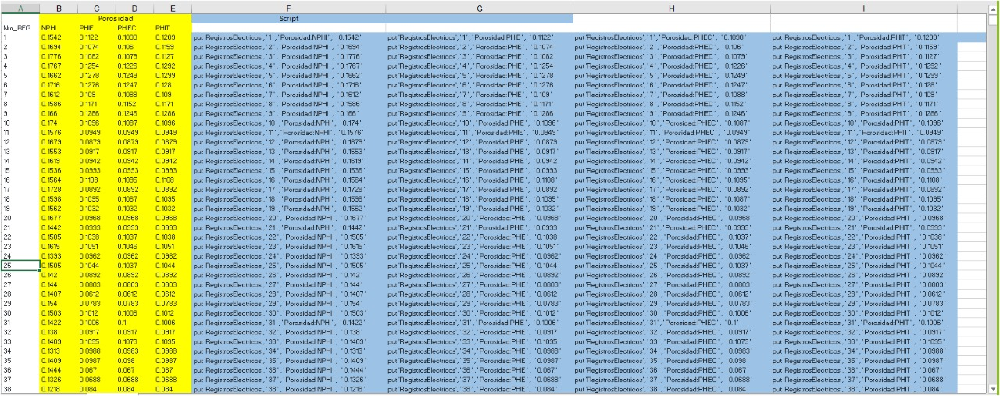

Script de Densidad

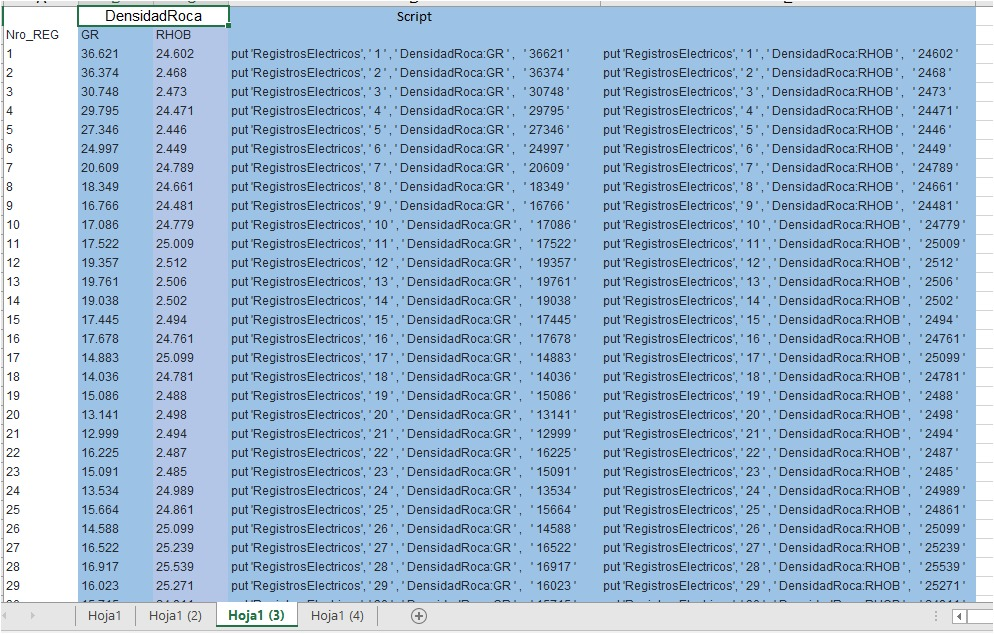

**Script de Densidad de Roca**
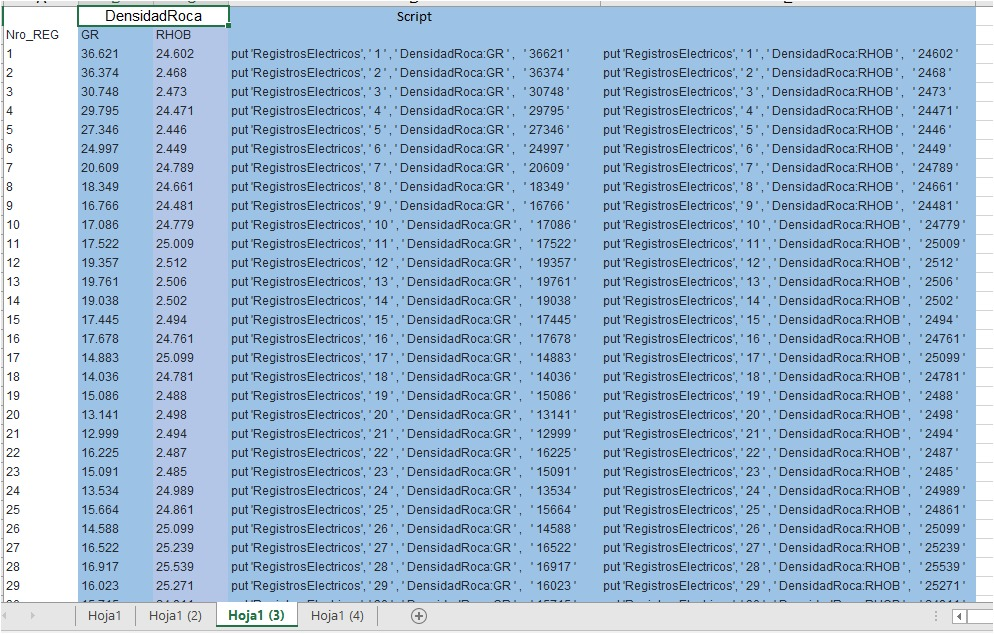

**Evidencia de la insercion de datos**

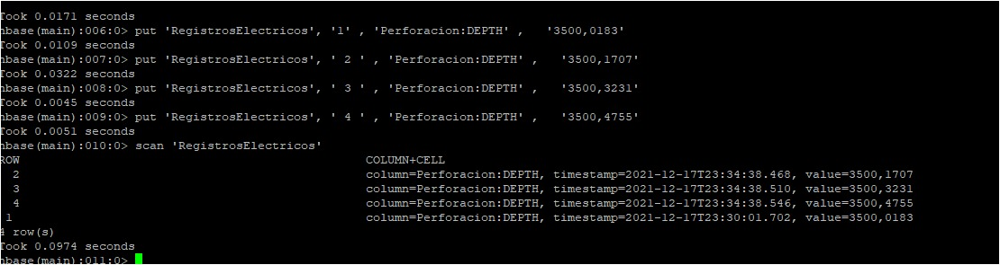

Ejecucion masiva de la Columna DEPTH en el Colemn Family Perforacion

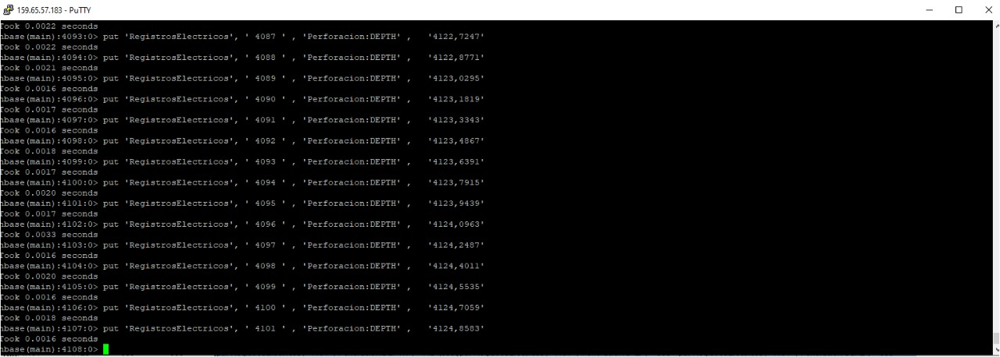

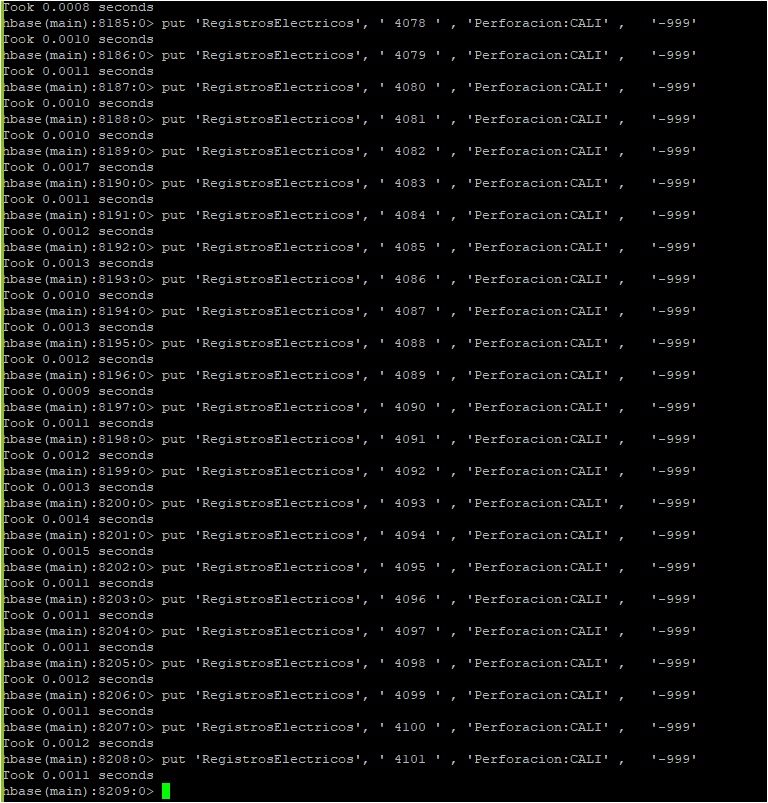

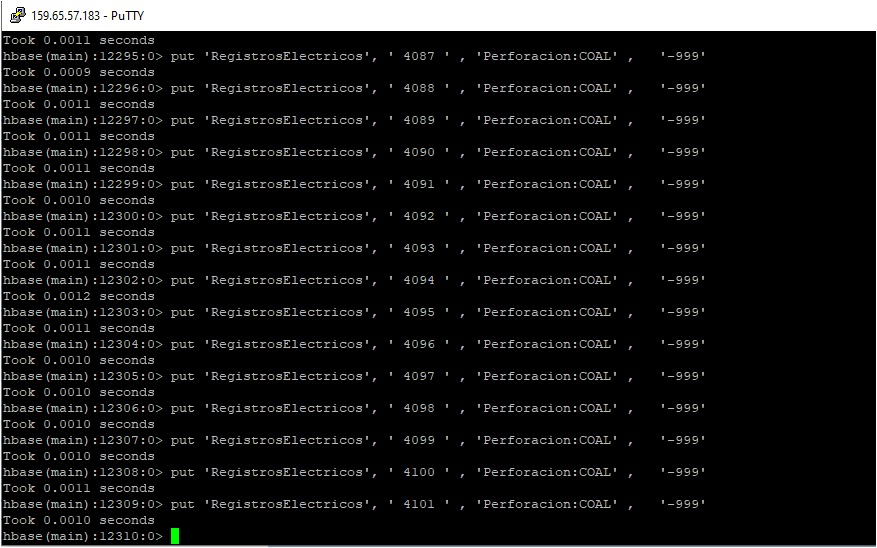

Familia de Porosidad
Incersion masiva de la Columna

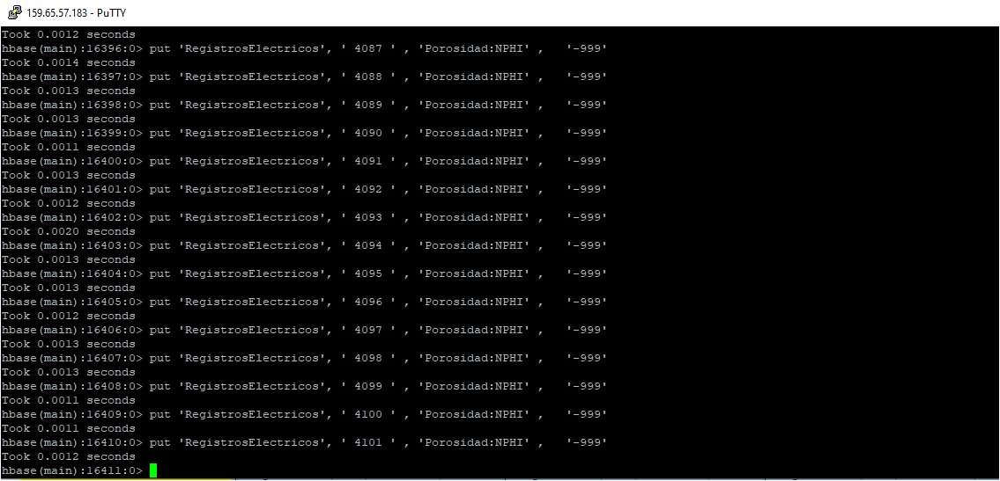

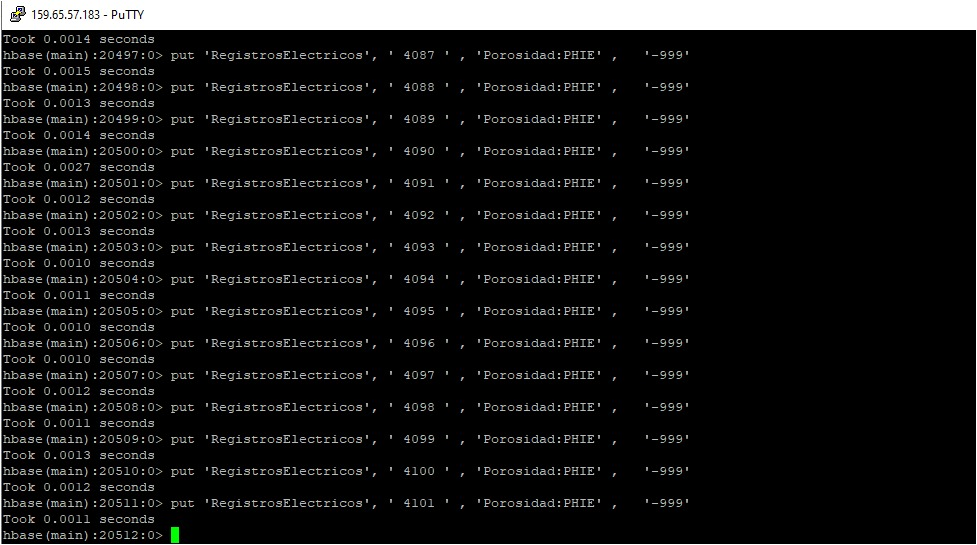

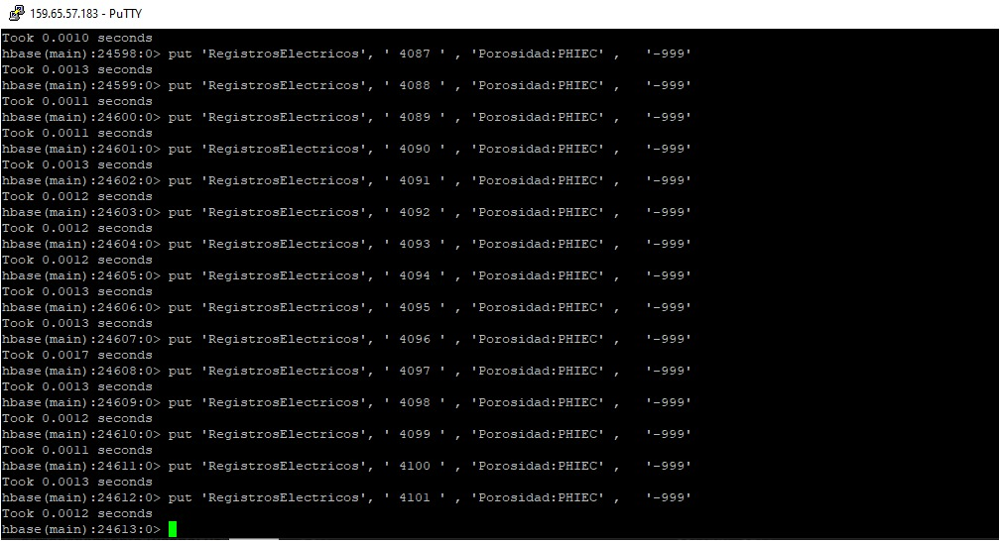

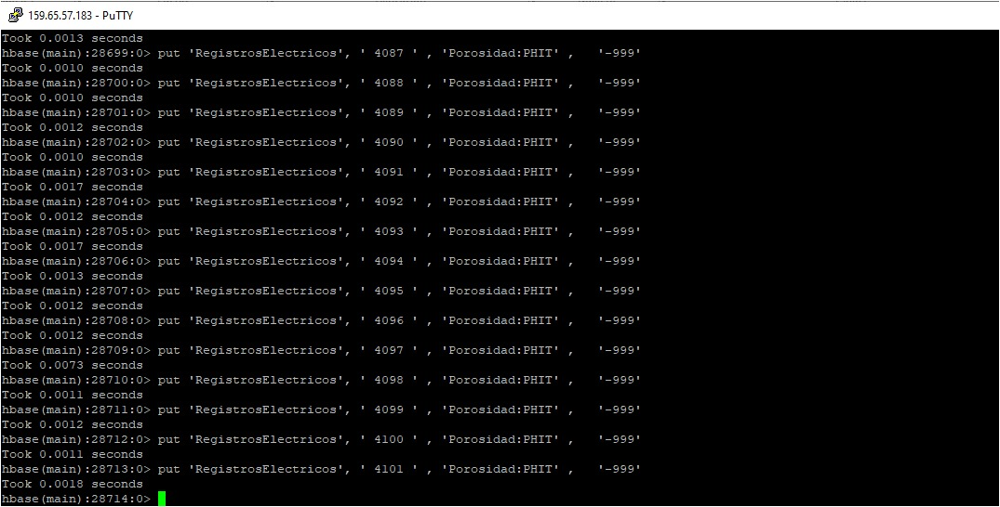

Columna de densidad de Roca
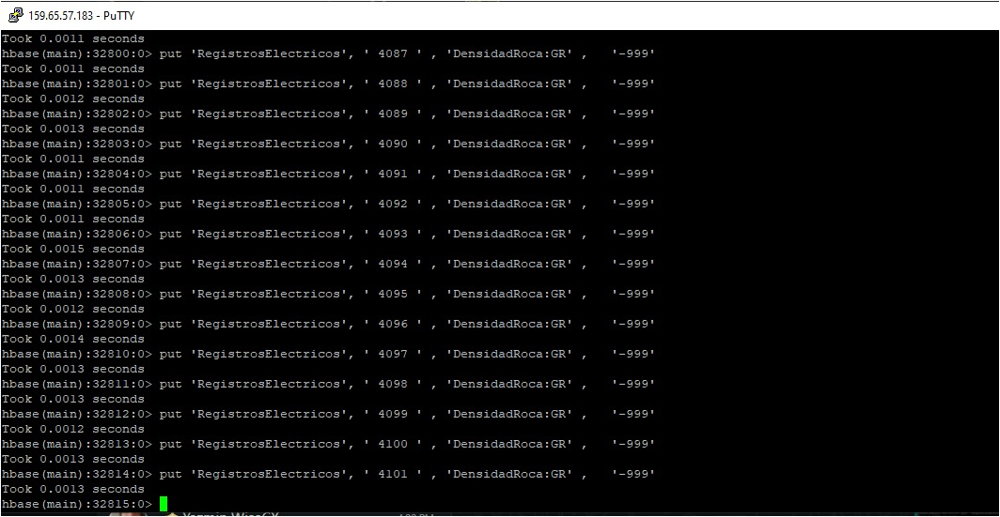

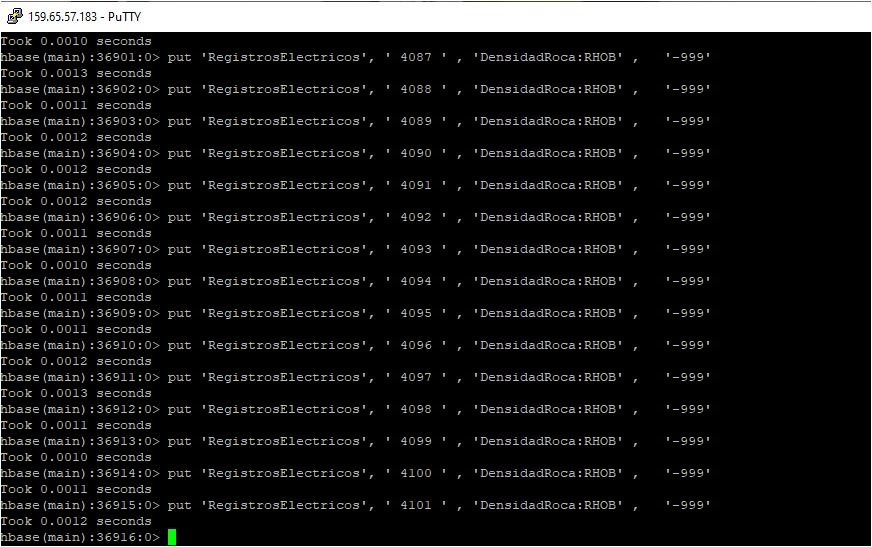

Columna Familia de Fluidos

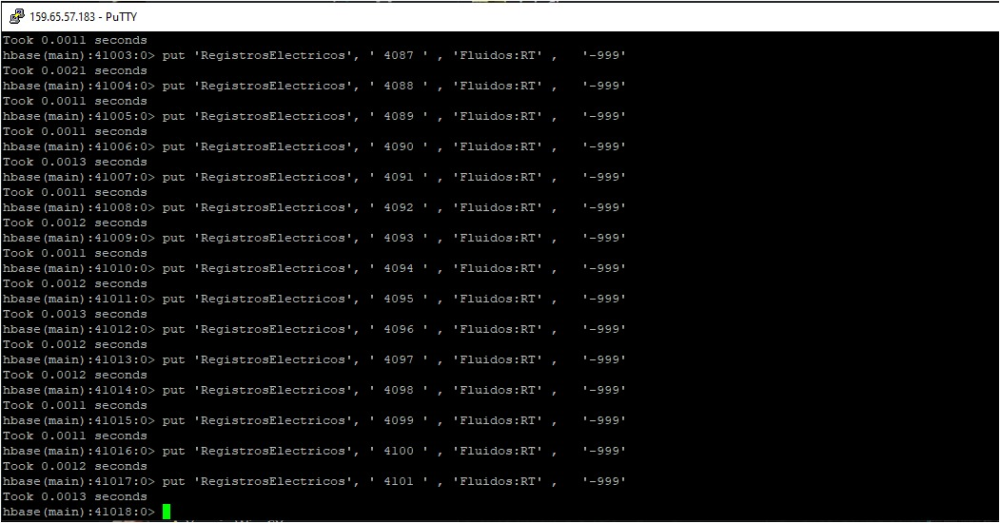

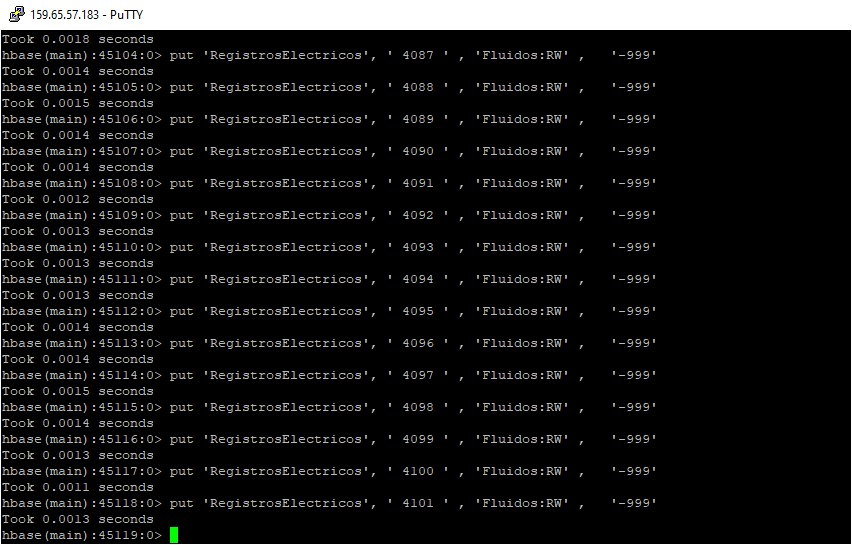

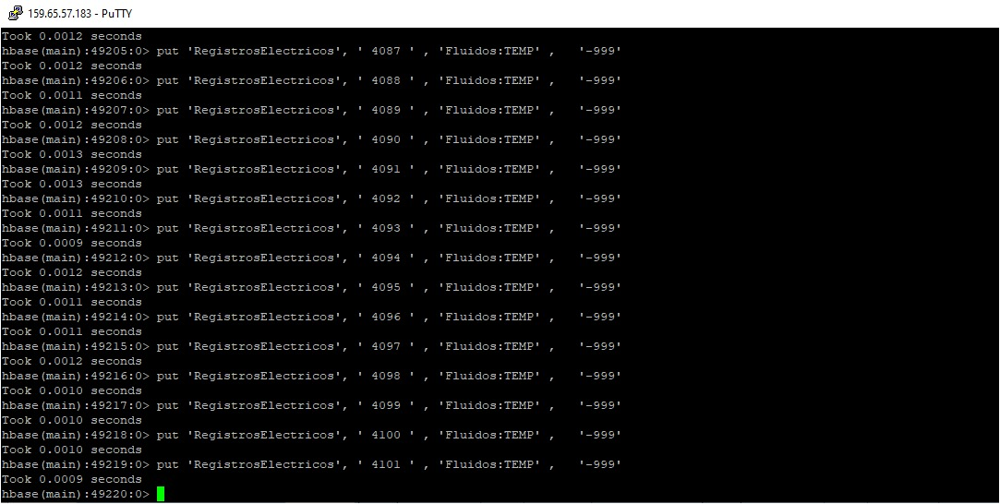

Ejecucion de Scan 

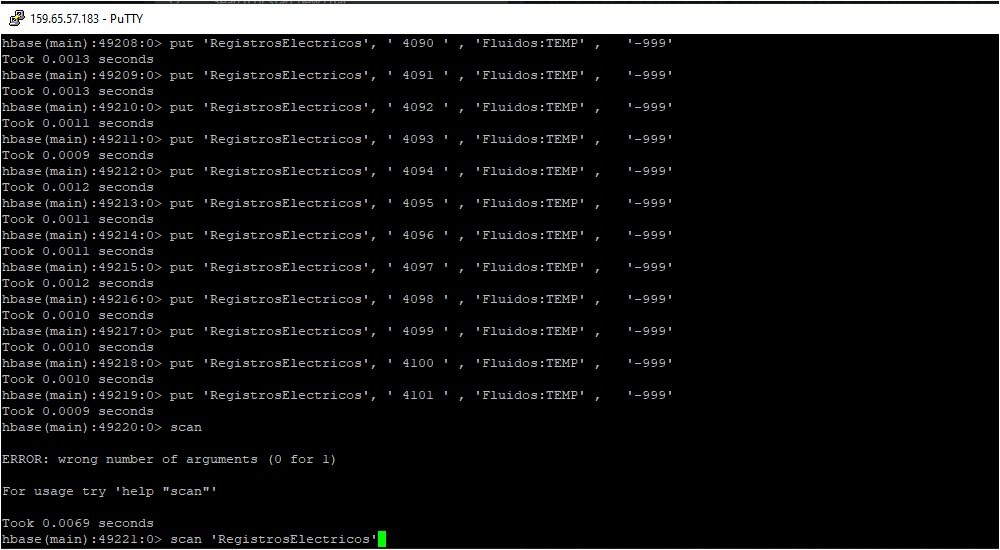

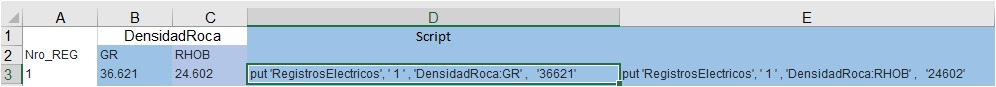

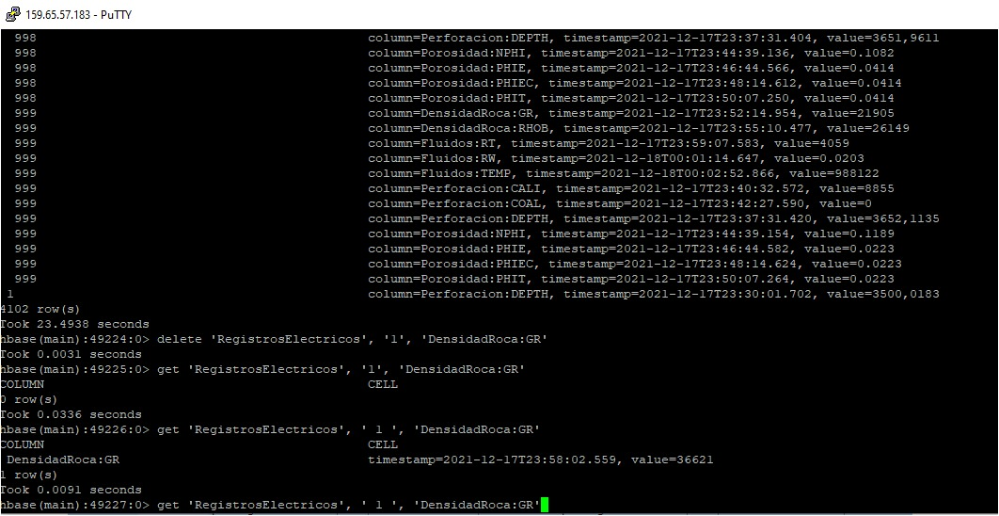

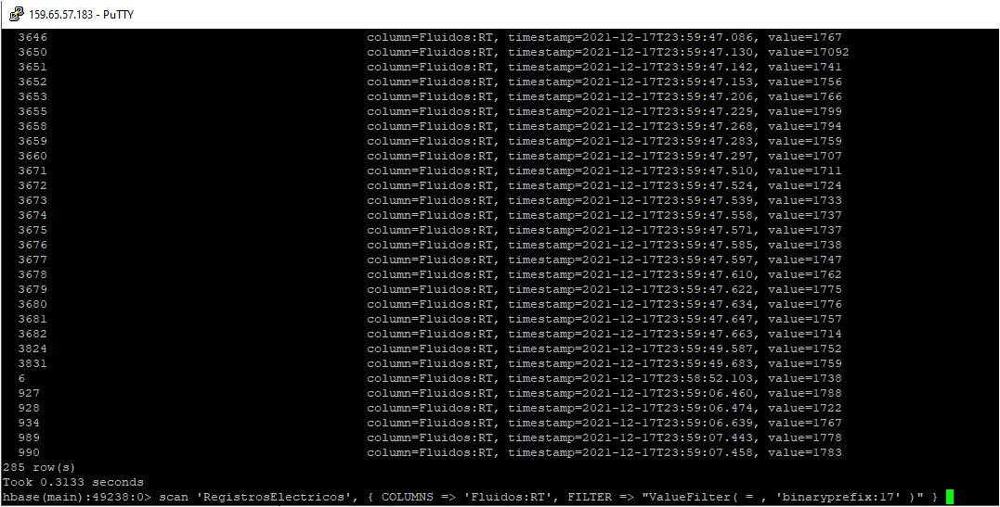

hbase(main):49238:0> scan 'RegistrosElectricos', { COLUMNS => 'Fluidos:RT', FILTER => "ValueFilter( = , 'binaryprefix:17' )" }


Consulta RT > a 6000

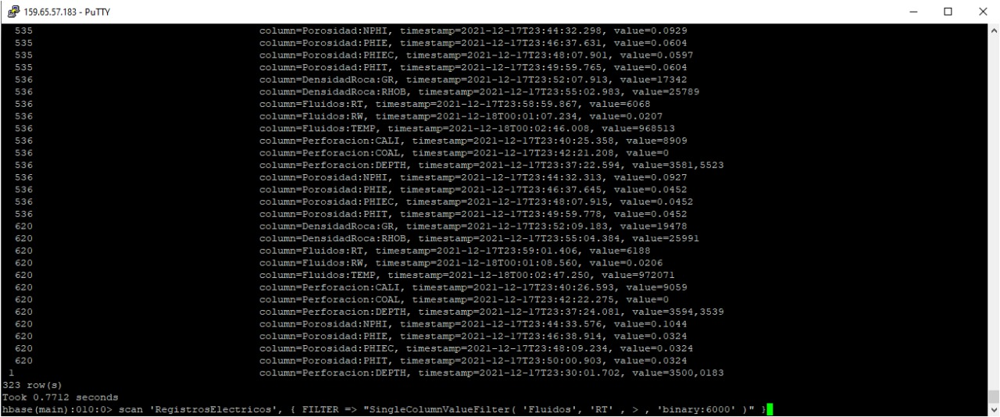

hbase(main):010:0> scan 'RegistrosElectricos', { FILTER => "SingleColumnValueFilter( 'Fluidos', 'RT' , > , 'binary:6000' )" }

**Resultados y Analisis**


<p align = "justify">HBase está estructurado en forma que tiene la estructura de filas y columnas de un RDBMS, como Oracle. Pero es una base de datos orientada a columnas y no a filas. Y es noSQL porque no puede usar SQL para construir relaciones entre tablas como puede hacerlo con un RDBMS, como JOIN.
HBase tiene una arquitectura maestro-esclavo. El servidor maestro coordina los servidores de la región. Los servidores de la región que son responsables de la escritura, lectura y otras operaciones de datos.
Tabla: una colección de filas.
Fila: una colección de familias de columnas.
Familia de columnas: una colección de columnas. HBase almacena datos por familia de columnas y no por filas. Esto permite una recuperación más rápida de las columnas, ya que están ubicadas cerca unas de otras.

<p align = "justify">Para el ejercico de manejo d registros electricos el HBASE parece dar una buena solucion porque su almacenamiento en columans es la forma como se registran realmente en le campo. esto permite un rapido acceso a los datos de forma independiente en cada pozo. 

<p align = "justify">El manejo de la gran cantidad de datos es realmente sorprendente, como facilmente pudimos identificar altas resistividades en segundos.

<p align = "justify">Esto debe ser ampliado a un campo completo ya si luego podemos aprender de los datos y crear algoritmos mucho mas eficientes que los actuales.






